# Variational Autoencoder (VAE)

Useful links: 
* Original paper http://arxiv.org/abs/1312.6114
* Helpful videos explaining the topic 
   * https://www.youtube.com/watch?v=P78QYjWh5sM     
   * http://videolectures.net/deeplearning2015_courville_autoencoder_extension/?q=aaron%20courville

In this homework we will train an autoencoder to model images of faces. For this we take "Labeled Faces in the Wild" dataset (LFW) (http://vis-www.cs.umass.edu/lfw/), deep funneled version of it. (frontal view of all faces)


## Prepare the data

In [1]:
import numpy as np
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind
from lfw_dataset import fetch_lfw_dataset
data, attrs = fetch_lfw_dataset()

In [3]:
X_train = data[:10000].reshape((10000, -1))
print(X_train.shape)
X_val = data[10000:].reshape((-1, X_train.shape[1]))
print(X_val.shape)

image_h = data.shape[1]
image_w = data.shape[2]

(10000, 6075)
(3143, 6075)


For simplicity we want all values of the data to lie in the interval $[0,1]$:

In [4]:
X_train = np.float32(X_train)
X_train = X_train/255
X_val = np.float32(X_val)
X_val = X_val/255

In [5]:
def plot_gallery(images, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
        plt.xticks(())
        plt.yticks(())
    plt.show()

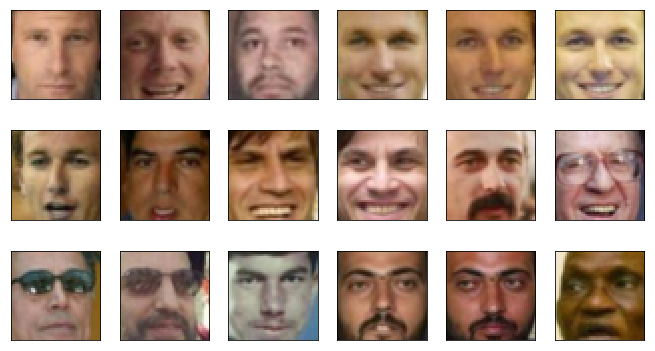

In [6]:
plot_gallery(X_train, image_h, image_w)

In [7]:
train = data_utils.TensorDataset(torch.Tensor(X_train), torch.zeros(X_train.shape[0],)) # pseudo labels needed to define TensorDataset
train_loader = data_utils.DataLoader(train, batch_size=100, shuffle=True)

val = data_utils.TensorDataset(torch.Tensor(X_val), torch.zeros(X_val.shape[0],))
val_loader = data_utils.DataLoader(val, batch_size=100, shuffle=False)

# Autoencoder

Why to use all this complicated formulaes and regularizations, what is the need for variational inference? To analyze the difference, let's first train just an autoencoder on the data:

<img src="Autoencoder_structure.png" alt="Autoencoder">

In [219]:
dimZ = 100 # Considering face reconstruction task, which size of representation seems reasonable?

# Define the decoder and encoder as networks with one hidden fc-layer
# (that means you will have 2 fc layers in each net)
# Use ReLU for hidden layers' activations
# GlorotUniform initialization for W
# Zero initialization for biases
# It's also convenient to put sigmoid activation on output layer to get nice normalized pics

class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        def init_biases(module):
            if isinstance(module, nn.Linear):
                module.bias.data.fill_(0.0)
        
        self.encoder = nn.Sequential(nn.Linear(6075, 512), nn.ReLU(), 
                                     nn.Linear(512, 100), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(100, 512), nn.ReLU(), 
                                     nn.Linear(512, 6075), nn.Sigmoid())
        self.encoder.apply(init_biases)
        self.decoder.apply(init_biases)
    
    
    def forward(self, x):
        latent_code = self.encoder(x)
        reconstruction = self.decoder(latent_code)
        
        return reconstruction, latent_code

In [220]:
# Create MSE loss function
criterion = torch.nn.MSELoss()

autoencoder = Autoencoder().cuda()

# Use Adam optimizer
optimizer = optim.Adam(autoencoder.parameters())

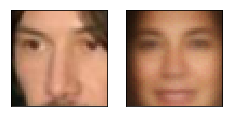

Epoch 0. Avg train loss: 0.02148258499801159


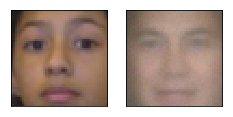

Avg valid loss: 0.016292240470647812


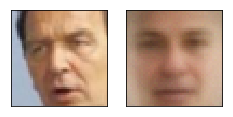

Epoch 1. Avg train loss: 0.013951430097222328


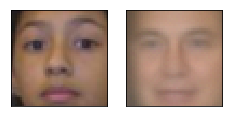

Avg valid loss: 0.013033514842391014


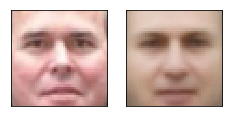

Epoch 2. Avg train loss: 0.011446893215179443


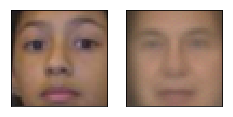

Avg valid loss: 0.010834161192178726


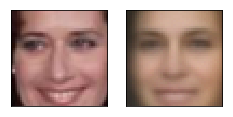

Epoch 3. Avg train loss: 0.009537750855088234


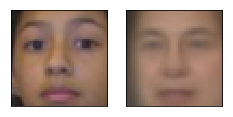

Avg valid loss: 0.0088967839255929


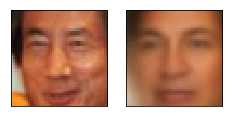

Epoch 4. Avg train loss: 0.008121451362967491


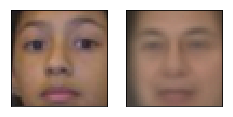

Avg valid loss: 0.008092140778899193


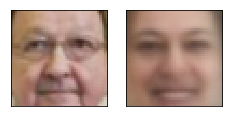

Epoch 5. Avg train loss: 0.0073480368591845036


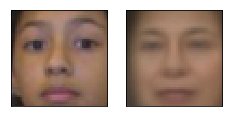

Avg valid loss: 0.006964720785617828


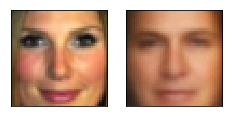

Epoch 6. Avg train loss: 0.00697622075676918


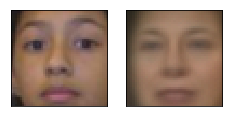

Avg valid loss: 0.006808915175497532


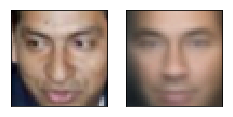

Epoch 7. Avg train loss: 0.006336616817861795


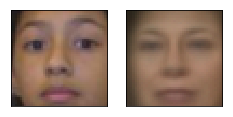

Avg valid loss: 0.0061643063090741634


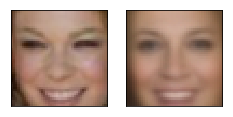

Epoch 8. Avg train loss: 0.006052996497601271


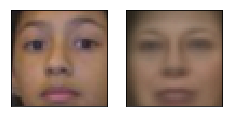

Avg valid loss: 0.00618527689948678


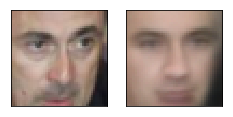

Epoch 9. Avg train loss: 0.005823109764605761


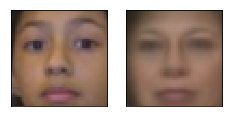

Avg valid loss: 0.005813367664813995


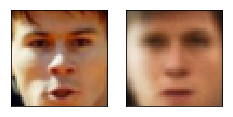

Epoch 10. Avg train loss: 0.005599407013505697


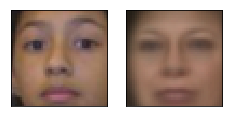

Avg valid loss: 0.005489223636686802


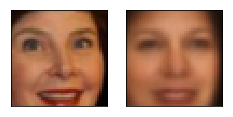

Epoch 11. Avg train loss: 0.005428975448012352


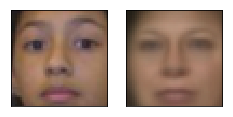

Avg valid loss: 0.005416532047092915


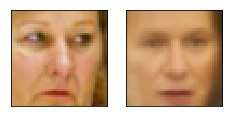

Epoch 12. Avg train loss: 0.005303360987454653


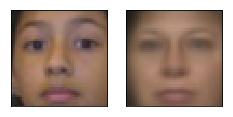

Avg valid loss: 0.00534881092607975


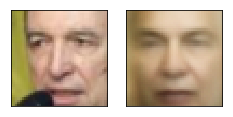

Epoch 13. Avg train loss: 0.005207038018852472


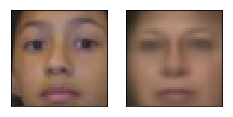

Avg valid loss: 0.0051940507255494595


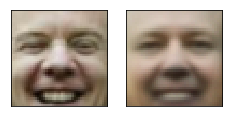

Epoch 14. Avg train loss: 0.005119675770401955


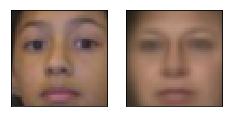

Avg valid loss: 0.005114783998578787


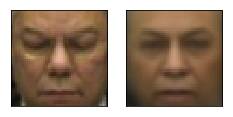

Epoch 15. Avg train loss: 0.00500701367855072


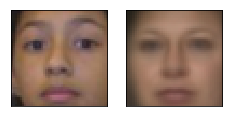

Avg valid loss: 0.005033509805798531


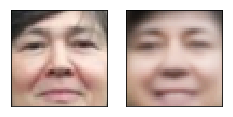

Epoch 16. Avg train loss: 0.004943067207932472


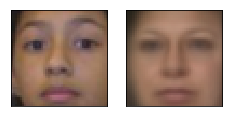

Avg valid loss: 0.004835375119000673


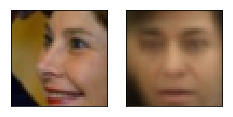

Epoch 17. Avg train loss: 0.004819483496248722


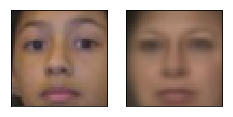

Avg valid loss: 0.0048073818907141685


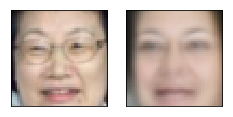

Epoch 18. Avg train loss: 0.0047607715241611


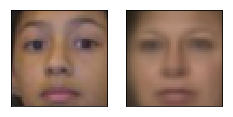

Avg valid loss: 0.004753109533339739


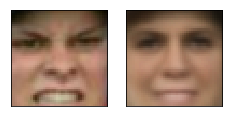

Epoch 19. Avg train loss: 0.004711677320301533


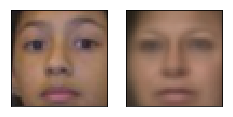

Avg valid loss: 0.004723110236227512


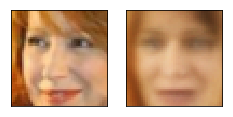

Epoch 20. Avg train loss: 0.004621992819011211


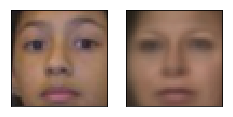

Avg valid loss: 0.004549313336610794


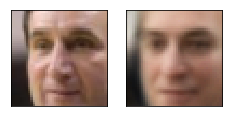

Epoch 21. Avg train loss: 0.004602811764925718


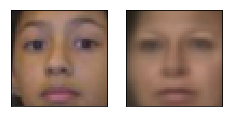

Avg valid loss: 0.004503089934587479


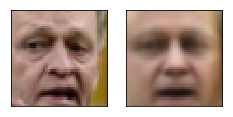

Epoch 22. Avg train loss: 0.0045393649488687515


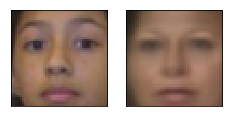

Avg valid loss: 0.0045525566674768925


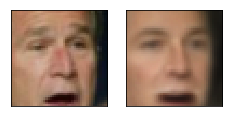

Epoch 23. Avg train loss: 0.0044484734535217285


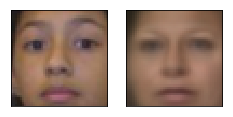

Avg valid loss: 0.0044653331860899925


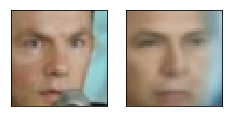

Epoch 24. Avg train loss: 0.004424082115292549


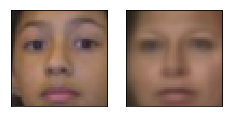

Avg valid loss: 0.004414679482579231


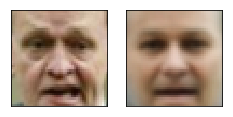

Epoch 25. Avg train loss: 0.004391114227473736


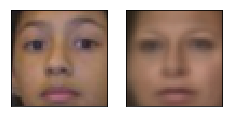

Avg valid loss: 0.004330994561314583


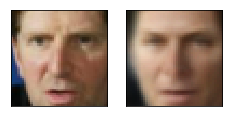

Epoch 26. Avg train loss: 0.004397024400532246


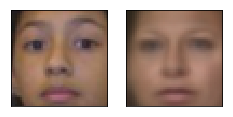

Avg valid loss: 0.0043558841571211815


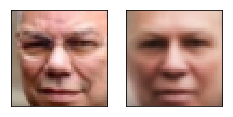

Epoch 27. Avg train loss: 0.00435277633368969


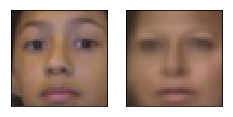

Avg valid loss: 0.004369515925645828


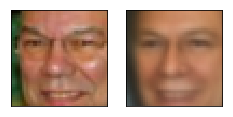

Epoch 28. Avg train loss: 0.004298957530409098


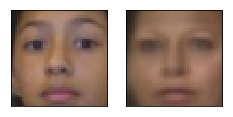

Avg valid loss: 0.0043881856836378574


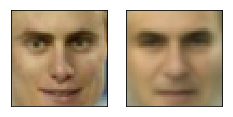

Epoch 29. Avg train loss: 0.004268449265509844


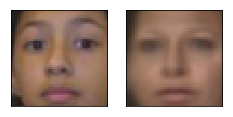

Avg valid loss: 0.004236671142280102


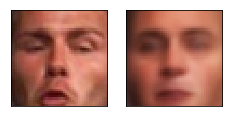

Epoch 30. Avg train loss: 0.004232233855873346


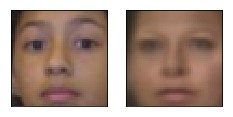

Avg valid loss: 0.004275151062756777


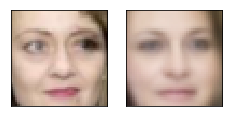

Epoch 31. Avg train loss: 0.004207794554531574


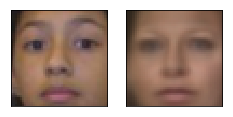

Avg valid loss: 0.0042050848715007305


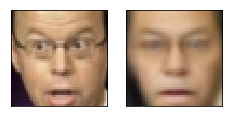

Epoch 32. Avg train loss: 0.004162219353020191


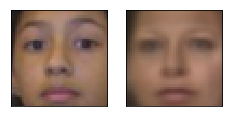

Avg valid loss: 0.004199820104986429


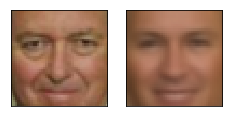

Epoch 33. Avg train loss: 0.004154667723923922


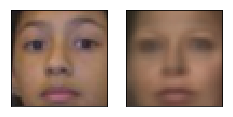

Avg valid loss: 0.004433535039424896


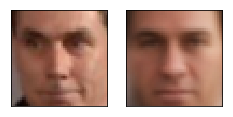

Epoch 34. Avg train loss: 0.004198804032057524


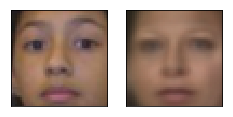

Avg valid loss: 0.004166903905570507


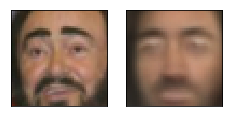

Epoch 35. Avg train loss: 0.004108800552785397


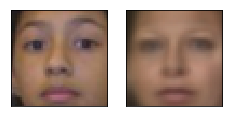

Avg valid loss: 0.004104078747332096


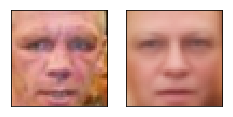

Epoch 36. Avg train loss: 0.004107148386538029


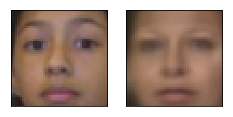

Avg valid loss: 0.004072877578437328


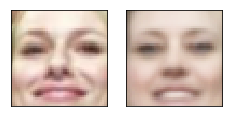

Epoch 37. Avg train loss: 0.004093777388334274


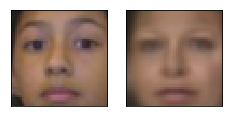

Avg valid loss: 0.004094033036381006


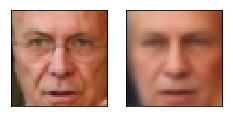

Epoch 38. Avg train loss: 0.004076540935784578


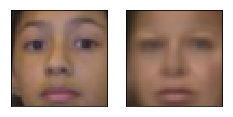

Avg valid loss: 0.0042999726720154285


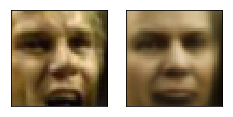

Epoch 39. Avg train loss: 0.00405857153236866


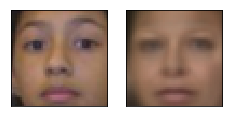

Avg valid loss: 0.0040725404396653175


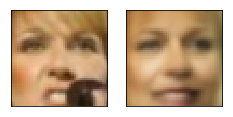

Epoch 40. Avg train loss: 0.004028083756566048


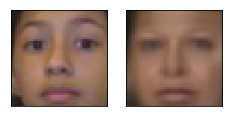

Avg valid loss: 0.004174401052296162


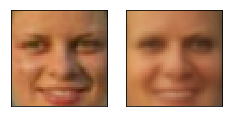

Epoch 41. Avg train loss: 0.004028366878628731


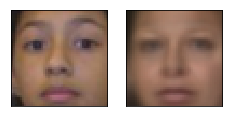

Avg valid loss: 0.004087264649569988


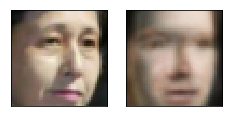

Epoch 42. Avg train loss: 0.003994041122496128


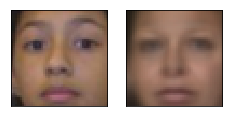

Avg valid loss: 0.0041250744834542274


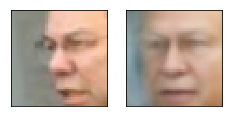

Epoch 43. Avg train loss: 0.0039954097010195255


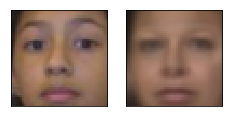

Avg valid loss: 0.004008655436336994


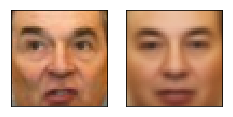

Epoch 44. Avg train loss: 0.003954681102186441


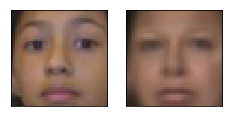

Avg valid loss: 0.004149335436522961


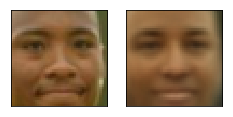

Epoch 45. Avg train loss: 0.003979149274528027


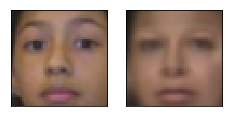

Avg valid loss: 0.0039757536724209785


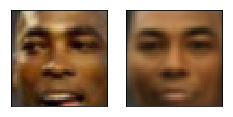

Epoch 46. Avg train loss: 0.003945792093873024


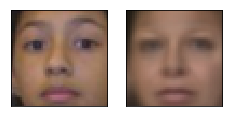

Avg valid loss: 0.0040627215057611465


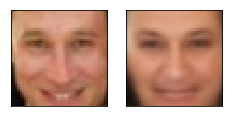

Epoch 47. Avg train loss: 0.003937230911105871


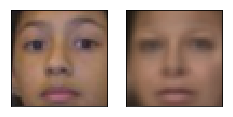

Avg valid loss: 0.003970983438193798


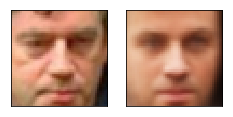

Epoch 48. Avg train loss: 0.003954723943024874


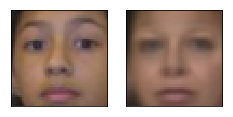

Avg valid loss: 0.004015455488115549


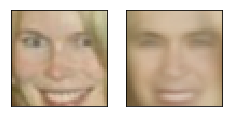

Epoch 49. Avg train loss: 0.0039201779291033745


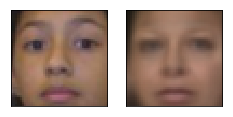

Avg valid loss: 0.0039341747760772705


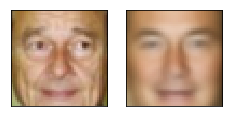

Epoch 50. Avg train loss: 0.003906568977981806


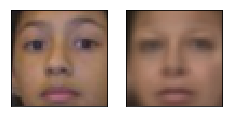

Avg valid loss: 0.0038999204989522696


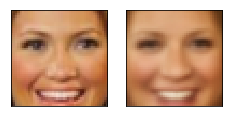

Epoch 51. Avg train loss: 0.003888110863044858


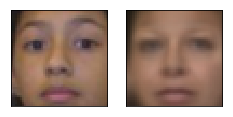

Avg valid loss: 0.00393824465572834


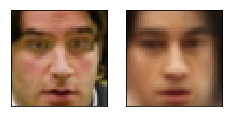

Epoch 52. Avg train loss: 0.003939828369766474


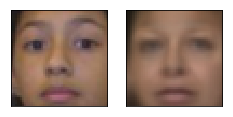

Avg valid loss: 0.003935039974749088


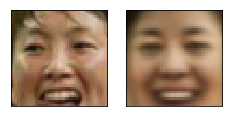

Epoch 53. Avg train loss: 0.0038981717079877853


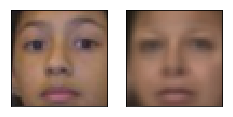

Avg valid loss: 0.003991249017417431


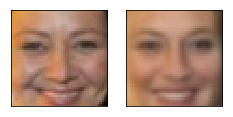

Epoch 54. Avg train loss: 0.003884263103827834


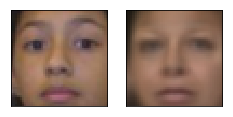

Avg valid loss: 0.0038824803195893764


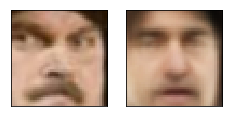

Epoch 55. Avg train loss: 0.0039062246214598417


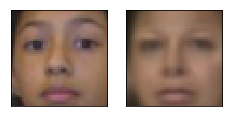

Avg valid loss: 0.003951036371290684


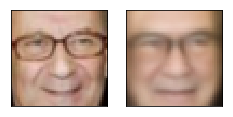

Epoch 56. Avg train loss: 0.003888634731993079


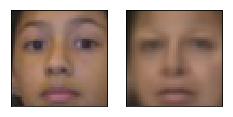

Avg valid loss: 0.0039484333246946335


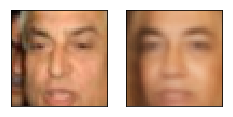

Epoch 57. Avg train loss: 0.003879016265273094


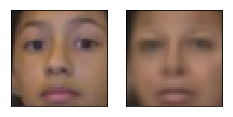

Avg valid loss: 0.003974121995270252


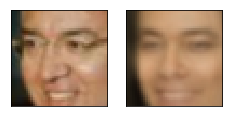

Epoch 58. Avg train loss: 0.0038642724975943565


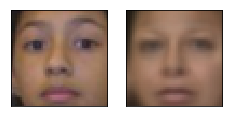

Avg valid loss: 0.0038887844420969486


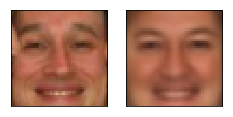

Epoch 59. Avg train loss: 0.0038666212931275368


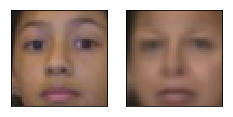

Avg valid loss: 0.004079386591911316


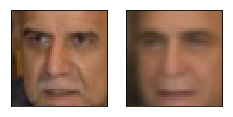

Epoch 60. Avg train loss: 0.0038774507120251656


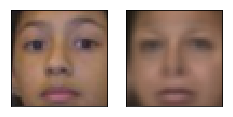

Avg valid loss: 0.003944694064557552


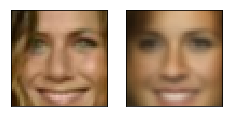

Epoch 61. Avg train loss: 0.003862078534439206


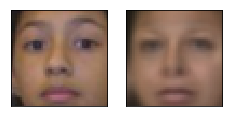

Avg valid loss: 0.0038853257428854704


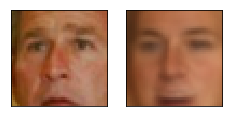

Epoch 62. Avg train loss: 0.0038408306427299976


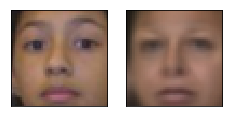

Avg valid loss: 0.00393849890679121


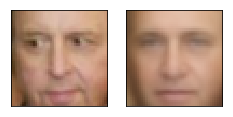

Epoch 63. Avg train loss: 0.0038652578368782997


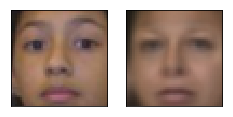

Avg valid loss: 0.0038986310828477144


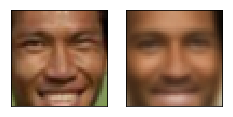

Epoch 64. Avg train loss: 0.0038368115201592445


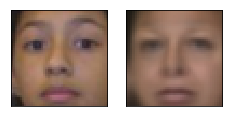

Avg valid loss: 0.003937161527574062


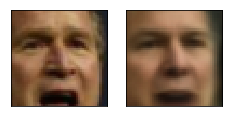

Epoch 65. Avg train loss: 0.0038436409085989


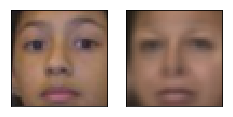

Avg valid loss: 0.0038960506208240986


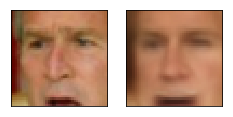

Epoch 66. Avg train loss: 0.0038769044913351536


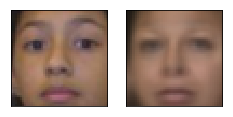

Avg valid loss: 0.0038846551906317472


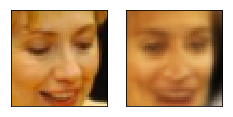

Epoch 67. Avg train loss: 0.0038253364618867636


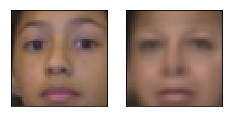

Avg valid loss: 0.0038989651948213577


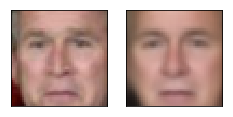

Epoch 68. Avg train loss: 0.0038186628371477127


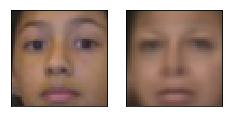

Avg valid loss: 0.0038172942586243153


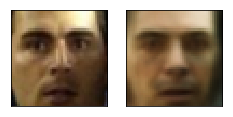

Epoch 69. Avg train loss: 0.003823392791673541


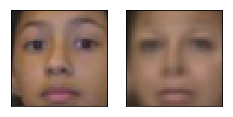

Avg valid loss: 0.0038903686217963696


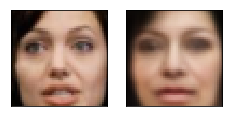

Epoch 70. Avg train loss: 0.003824763000011444


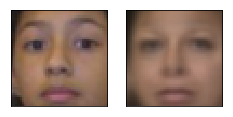

Avg valid loss: 0.0038085542619228363


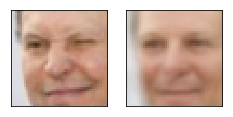

Epoch 71. Avg train loss: 0.003779736114665866


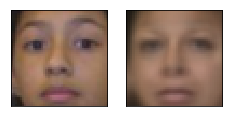

Avg valid loss: 0.003808981738984585


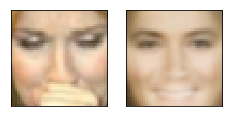

Epoch 72. Avg train loss: 0.00380618404597044


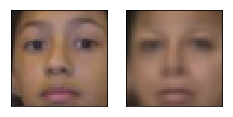

Avg valid loss: 0.0038311267271637917


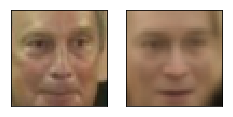

Epoch 73. Avg train loss: 0.0038028117269277573


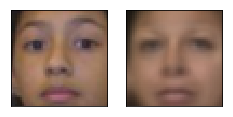

Avg valid loss: 0.003866004291921854


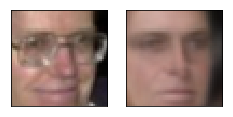

Epoch 74. Avg train loss: 0.0038028352428227663


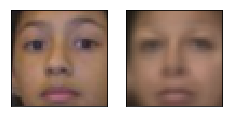

Avg valid loss: 0.0038589276373386383


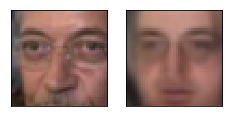

Epoch 75. Avg train loss: 0.003813185729086399


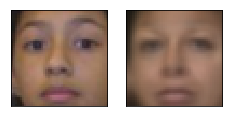

Avg valid loss: 0.003798175835981965


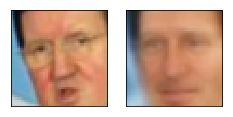

Epoch 76. Avg train loss: 0.0038064748514443636


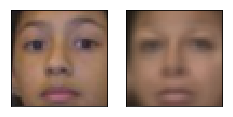

Avg valid loss: 0.003818918950855732


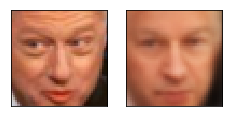

Epoch 77. Avg train loss: 0.0037965646479278803


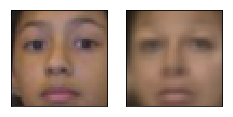

Avg valid loss: 0.003904756624251604


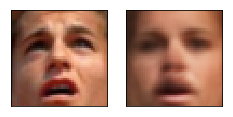

Epoch 78. Avg train loss: 0.003814492840319872


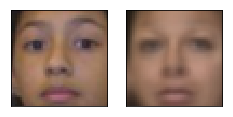

Avg valid loss: 0.0038774257991462946


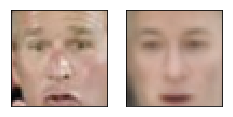

Epoch 79. Avg train loss: 0.0037925676442682743


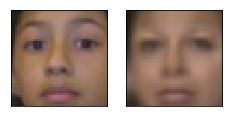

Avg valid loss: 0.003789203707128763


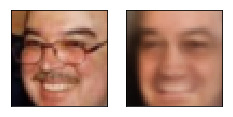

Epoch 80. Avg train loss: 0.003774607554078102


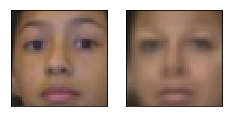

Avg valid loss: 0.0037875641137361526


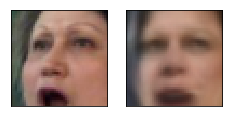

Epoch 81. Avg train loss: 0.0037549352273344994


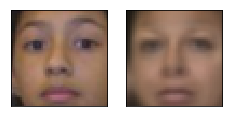

Avg valid loss: 0.003735568840056658


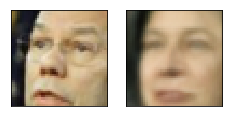

Epoch 82. Avg train loss: 0.003770114853978157


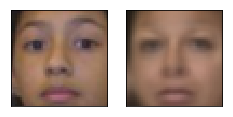

Avg valid loss: 0.0037709297612309456


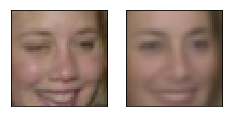

Epoch 83. Avg train loss: 0.0037784078158438206


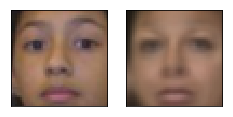

Avg valid loss: 0.00375957228243351


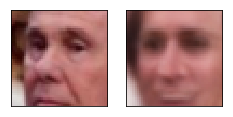

Epoch 84. Avg train loss: 0.003760794410482049


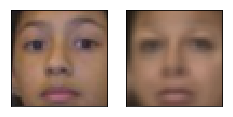

Avg valid loss: 0.0037473859265446663


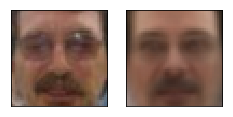

Epoch 85. Avg train loss: 0.00375739810988307


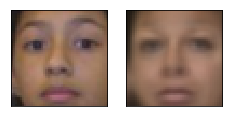

Avg valid loss: 0.003743705339729786


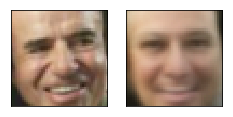

Epoch 86. Avg train loss: 0.0037559811025857925


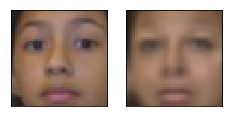

Avg valid loss: 0.003874922404065728


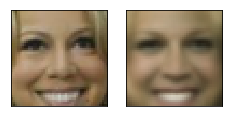

Epoch 87. Avg train loss: 0.0037626333069056273


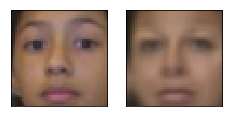

Avg valid loss: 0.0037421886809170246


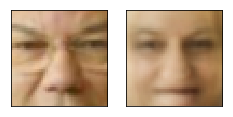

Epoch 88. Avg train loss: 0.0037621171213686466


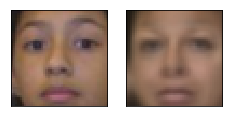

Avg valid loss: 0.0037228281144052744


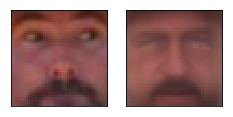

Epoch 89. Avg train loss: 0.0037494602147489786


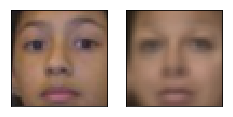

Avg valid loss: 0.0038413156289607286


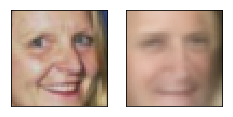

Epoch 90. Avg train loss: 0.0037483256310224533


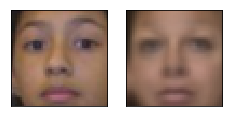

Avg valid loss: 0.0038929397705942392


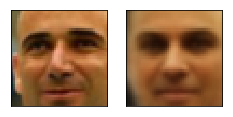

Epoch 91. Avg train loss: 0.003763343207538128


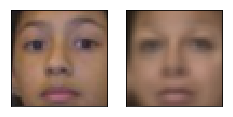

Avg valid loss: 0.003717703279107809


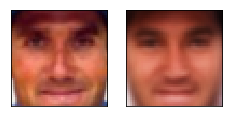

Epoch 92. Avg train loss: 0.003738989820703864


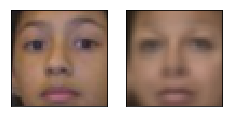

Avg valid loss: 0.0037673143669962883


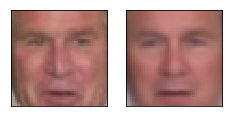

Epoch 93. Avg train loss: 0.0037341350689530373


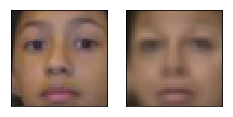

Avg valid loss: 0.0036968723870813847


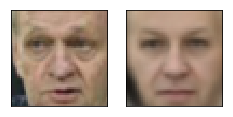

Epoch 94. Avg train loss: 0.003724751528352499


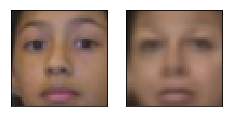

Avg valid loss: 0.003716991515830159


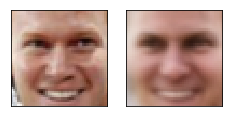

Epoch 95. Avg train loss: 0.0037262362893670797


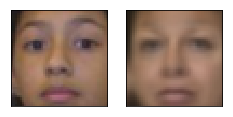

Avg valid loss: 0.003789279842749238


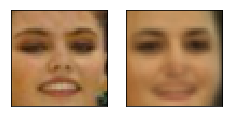

Epoch 96. Avg train loss: 0.0037539065815508366


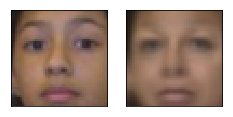

Avg valid loss: 0.003700168104842305


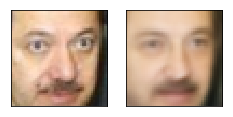

Epoch 97. Avg train loss: 0.003733965801075101


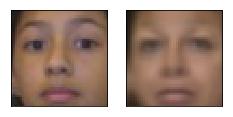

Avg valid loss: 0.003711594035848975


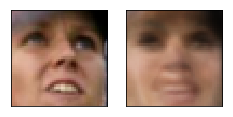

Epoch 98. Avg train loss: 0.0037609171122312546


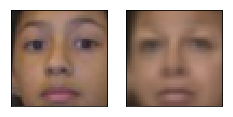

Avg valid loss: 0.003701921086758375


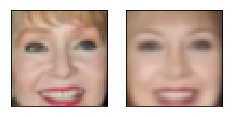

Epoch 99. Avg train loss: 0.0037108573596924543


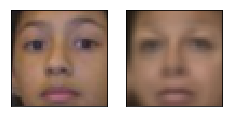

Avg valid loss: 0.003683424089103937


In [221]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay
num_epochs = 100
for epoch in range(num_epochs):
    autoencoder.train(True)
    losses = []
    for idx, (img_batch, _)  in enumerate(train_loader):
        img_batch = torch.autograd.Variable(img_batch).cuda()
        reconstructed_img_batch, latent_codes = autoencoder(img_batch)
        loss = criterion(reconstructed_img_batch, img_batch)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        losses.append(loss.data.cpu().numpy()[0])
    plot_gallery([img_batch[0].data.cpu().numpy(),
                  reconstructed_img_batch[0].data.cpu().numpy()],
                 image_h, image_w, n_col=2, n_row=1)
    print("Epoch {}. Avg train loss: {}".format(epoch, np.mean(losses)))
    autoencoder.train(False)
    losses = []
    for idx, (img_batch, _) in enumerate(val_loader):
        img_batch = torch.autograd.Variable(img_batch).cuda()
        reconstructed_img_batch, latent_codes = autoencoder(img_batch)
        loss = criterion(reconstructed_img_batch, img_batch)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        losses.append(loss.data.cpu().numpy()[0])
    plot_gallery([img_batch[0].data.cpu().numpy(),
                  reconstructed_img_batch[0].data.cpu().numpy()],
                 image_h, image_w, n_col=2, n_row=1)
    print("Avg valid loss: {}".format(np.mean(losses)))

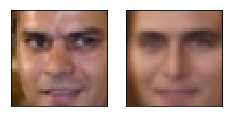

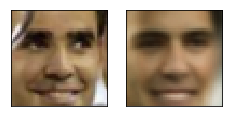

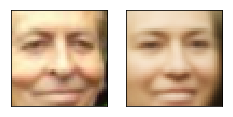

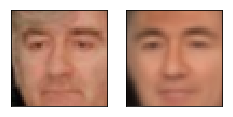

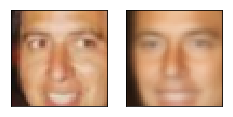

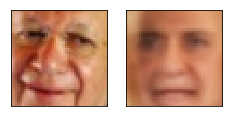

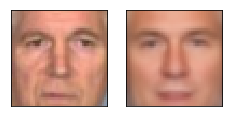

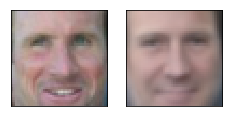

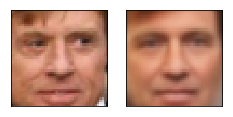

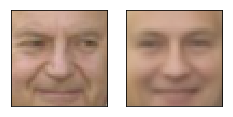

In [224]:
# Examine the reconstructions
for j, data_ in enumerate(val_loader, 0):
    inp = Variable(data_[0].cuda())
    pred, _ = autoencoder(inp)
    plot_gallery([data_[0][0].numpy(), pred[0].data.cpu().numpy()], image_h, image_w, n_row=1, n_col=2)
    if (j >= 9):
        break

Reconstruction is not bad, right? 

# Sampling

Let's now sample several latent vectors and perform inference from $z$, reconstruct an image given some random $z$ representations.

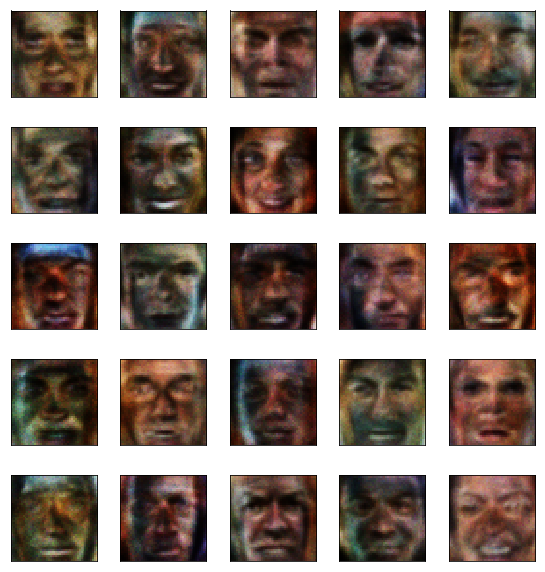

In [232]:
z = np.random.randn(25, dimZ)
output = autoencoder.decoder(Variable(torch.from_numpy(z).cuda()).float())
plot_gallery(output.data.cpu().numpy(), image_h, image_w, n_row=5, n_col=5)

So, if we sample $z$ from normal, whould we eventually generate all possible faces? What do you think?

# Variational Autoencoder

Bayesian approach in deep learning considers everything in terms of distributions. Now our encoder generates not just a vector $z$ but posterior ditribution $q(z|x)$. In our case distribution $q$ is Gaussian distibution $N(\mu, \sigma)$ with parameters $\mu$, $\sigma$. Technically, the first difference is that you need to split bottleneck layer in two. One dense layer will generate vector $\mu$, and another will generate vector $\sigma$. Reparametrization trick should be implemented using the **gaussian_sampler** layer, that generates random vetor $\epsilon$ and returns $\mu+\sigma\epsilon \sim N(\mu, \sigma)$ .

Since our decoder is also a function that generates distribution, we need to do the same splitting for output layer. When testing the model we will look only on mean values, so one of the output will be actual autoencoder output.

In this homework we only ask for implementation of the simplest version of VAE - one $z$ sample per input. You can consider to sample several outputs from one input and average them.

In [30]:
# to compare with conventional AE, keep these hyperparameters
# or change them for the values that you used before
dimZ = 100

# define the network
# you can start from https://github.com/pytorch/examples/blob/master/vae/main.py
# or Theano-based examples here https://github.com/Lasagne/Recipes/blob/master/examples/variational_autoencoder/variational_autoencoder.py
# and here https://github.com/y0ast/Variational-Autoencoder/blob/master/VAE.py
# but remember that this is not your ground truth since the data is not MNIST

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        def init_biases(module):
            if isinstance(module, nn.Linear):
                module.bias.data.fill_(0.0)
        
        self.encoder = nn.Sequential(nn.Linear(6075, 3100),
                                     nn.BatchNorm1d(3100),
                                     nn.ReLU(),
                                     nn.Linear(3100, 1550),
                                     nn.BatchNorm1d(1550),
                                     nn.ReLU())
        self.latent_mu_producer = nn.Linear(1550, dimZ)
        self.latent_logsigma_producer = nn.Linear(1550, dimZ)
        self.decoder = nn.Sequential(nn.Linear(dimZ, 1550),
                                     nn.BatchNorm1d(1550),
                                     nn.ReLU(),
                                     nn.Linear(1550, 3100),
                                     nn.BatchNorm1d(3100),
                                     nn.ReLU())
        self.reconstruction_mu_producer = nn.Linear(3100, 6075)
        self.reconstruction_logsigma_producer = nn.Linear(3100, 6075)
        
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = logsigma.exp()
            eps = Variable(std.data.new(std.size()).normal_())
            return eps.mul(std).add_(mu)
        else:
            return mu

    def forward(self, x):
        x = self.encoder(x)
        latent_mu = self.latent_mu_producer(x)
        latent_logsigma = self.latent_logsigma_producer(x)
        z = self.gaussian_sampler(latent_mu, latent_logsigma)
        z_hat = self.decoder(z)
        reconstruction_mu = F.sigmoid(self.reconstruction_mu_producer(z_hat))
        reconstruction_logsigma = self.reconstruction_logsigma_producer(z_hat)
        return reconstruction_mu, reconstruction_logsigma, latent_mu, latent_logsigma

And the last, but not least! Place in the code where the most of the formulaes goes to - optimization objective. The objective for VAE has it's own name - variational lowerbound. And as for any lowerbound our intention is to maximize it. Here it is (for one sample $z$ per input $x$):

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p_{\theta}(z)) + \log p_{\theta}(x|z)$$

Your next task is to implement two functions that compute KL-divergence and the second term - log-likelihood of an output. Here is some necessary math for your convenience:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$
$$\log p_{\theta}(x|z) = \sum_{i=1}^{dimX}\log p_{\theta}(x_i|z)=\sum_{i=1}^{dimX} \log \Big( \frac{1}{\sigma_i\sqrt{2\pi}}e^{-\frac{(\mu_I-x)^2}{2\sigma_i^2}} \Big)=...$$

Don't forget in the code that you are using $\log\sigma$ as variable. Explain, why not $\sigma$?

In [31]:
import math
def KL_divergence(mu, logsigma):
    two_logsigma = 2 * logsigma
    return -0.5 * torch.sum(1 + two_logsigma - mu ** 2 - torch.exp(two_logsigma), 1)

def log_likelihood(x, mu, logsigma):
    two_logsigma = 2 * logsigma
    return torch.sum(- logsigma
                     - (mu - x) ** 2 / (2 * torch.exp(two_logsigma)), 1)

def loss_vae(x, mu_gen, logsigma_gen, mu_z, logsigma_z):
    return -torch.mean(- KL_divergence(mu_z, logsigma_z) + log_likelihood(x, mu_gen, logsigma_gen)) 

In [32]:
vae = VAE().cuda()
criterion = loss_vae
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-4)

And train the model:

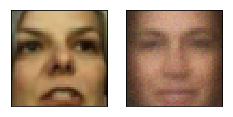

Epoch 0. Avg train loss: -8286.78125


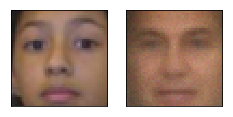

Avg valid loss: -8321.6259765625


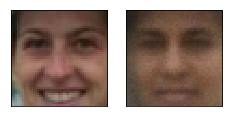

Epoch 1. Avg train loss: -10581.90625


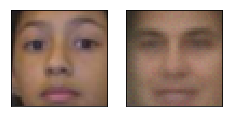

Avg valid loss: -11238.556640625


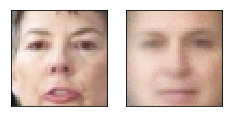

Epoch 2. Avg train loss: -11505.4013671875


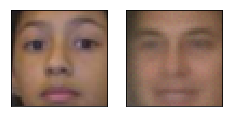

Avg valid loss: -11805.025390625


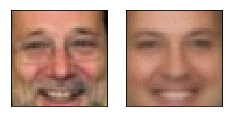

Epoch 3. Avg train loss: -11930.287109375


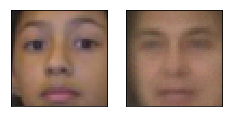

Avg valid loss: -12196.337890625


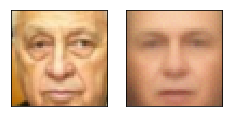

Epoch 4. Avg train loss: -12214.4052734375


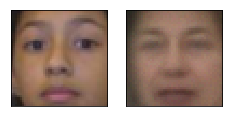

Avg valid loss: -12343.6318359375


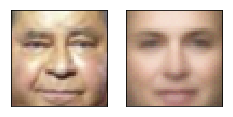

Epoch 5. Avg train loss: -12451.9775390625


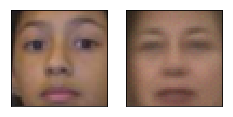

Avg valid loss: -12772.6298828125


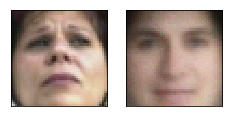

Epoch 6. Avg train loss: -12636.412109375


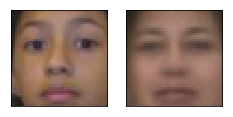

Avg valid loss: -12881.2265625


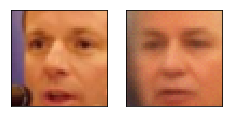

Epoch 7. Avg train loss: -12801.201171875


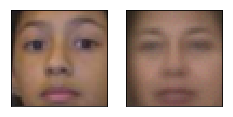

Avg valid loss: -12987.603515625


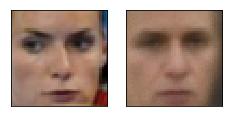

Epoch 8. Avg train loss: -12927.021484375


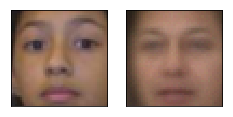

Avg valid loss: -13102.84375


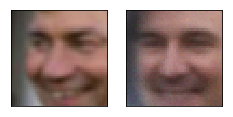

Epoch 9. Avg train loss: -13085.1298828125


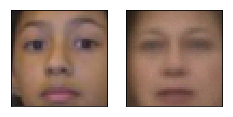

Avg valid loss: -13357.669921875


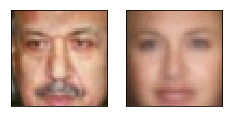

Epoch 10. Avg train loss: -13196.61328125


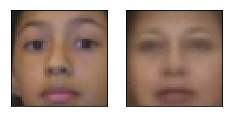

Avg valid loss: -13486.13671875


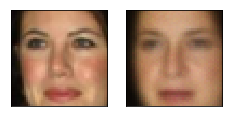

Epoch 11. Avg train loss: -13296.27734375


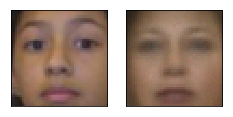

Avg valid loss: -13542.716796875


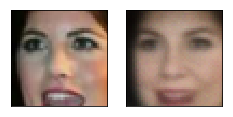

Epoch 12. Avg train loss: -13360.544921875


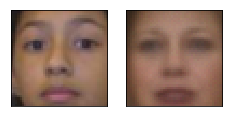

Avg valid loss: -13568.357421875


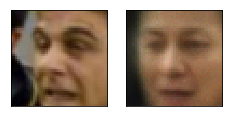

Epoch 13. Avg train loss: -13434.1396484375


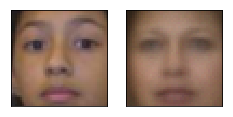

Avg valid loss: -13733.0478515625


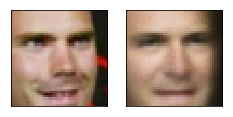

Epoch 14. Avg train loss: -13517.4833984375


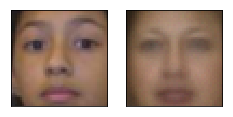

Avg valid loss: -13794.609375


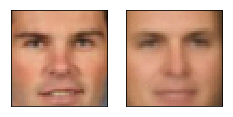

Epoch 15. Avg train loss: -13590.2861328125


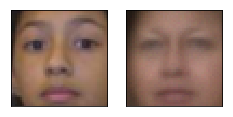

Avg valid loss: -13981.314453125


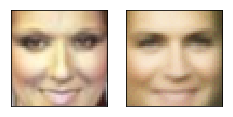

Epoch 16. Avg train loss: -13630.9912109375


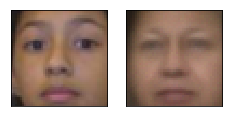

Avg valid loss: -14067.2109375


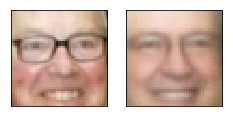

Epoch 17. Avg train loss: -13698.4150390625


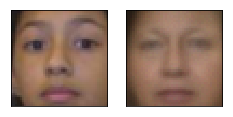

Avg valid loss: -14013.796875


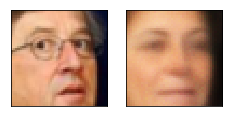

Epoch 18. Avg train loss: -13752.09765625


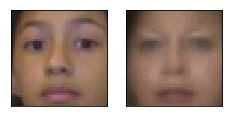

Avg valid loss: -14160.8564453125


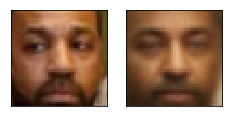

Epoch 19. Avg train loss: -13879.3515625


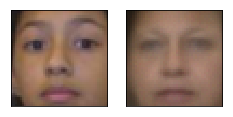

Avg valid loss: -14195.75


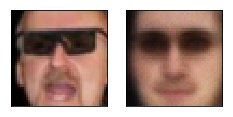

Epoch 20. Avg train loss: -13924.0947265625


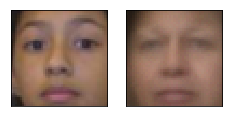

Avg valid loss: -14178.267578125


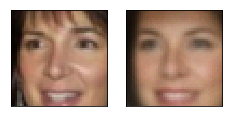

Epoch 21. Avg train loss: -13983.1396484375


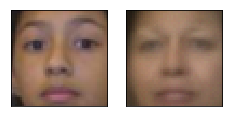

Avg valid loss: -14343.4013671875


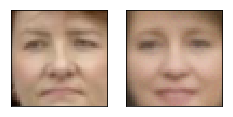

Epoch 22. Avg train loss: -14089.4765625


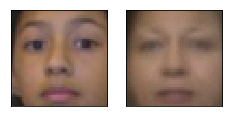

Avg valid loss: -14434.2412109375


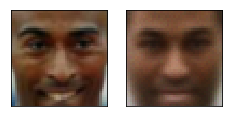

Epoch 23. Avg train loss: -14085.5283203125


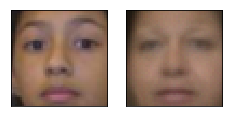

Avg valid loss: -14436.0234375


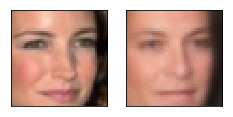

Epoch 24. Avg train loss: -14140.1845703125


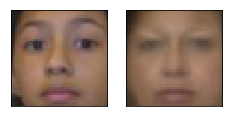

Avg valid loss: -14361.91796875


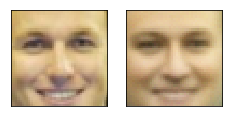

Epoch 25. Avg train loss: -14131.10546875


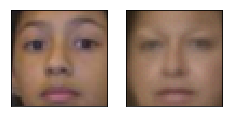

Avg valid loss: -14405.7373046875


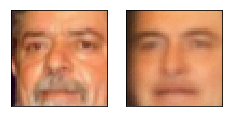

Epoch 26. Avg train loss: -14180.6298828125


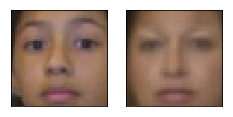

Avg valid loss: -14637.9921875


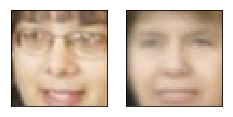

Epoch 27. Avg train loss: -14285.232421875


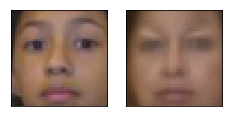

Avg valid loss: -14578.12890625


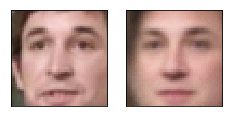

Epoch 28. Avg train loss: -14330.6435546875


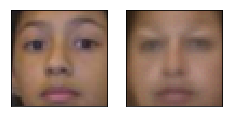

Avg valid loss: -14645.123046875


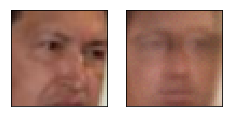

Epoch 29. Avg train loss: -14410.705078125


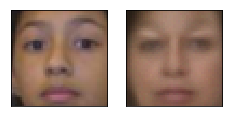

Avg valid loss: -14535.001953125


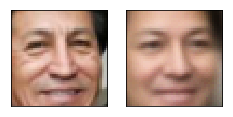

Epoch 30. Avg train loss: -14355.45703125


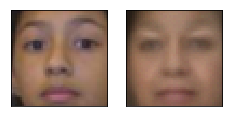

Avg valid loss: -14644.06640625


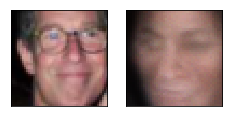

Epoch 31. Avg train loss: -14411.005859375


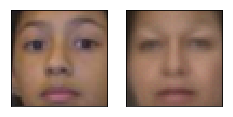

Avg valid loss: -14725.060546875


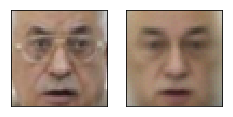

Epoch 32. Avg train loss: -14460.291015625


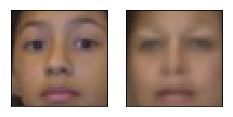

Avg valid loss: -14773.4375


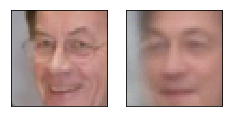

Epoch 33. Avg train loss: -14498.3525390625


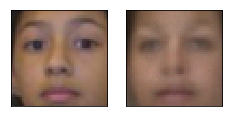

Avg valid loss: -14873.35546875


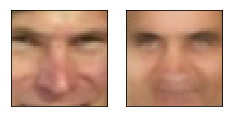

Epoch 34. Avg train loss: -14534.212890625


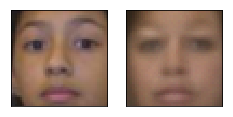

Avg valid loss: -14827.501953125


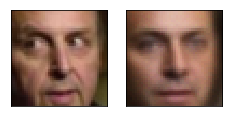

Epoch 35. Avg train loss: -14518.83203125


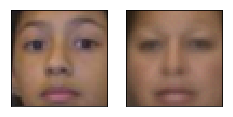

Avg valid loss: -14826.869140625


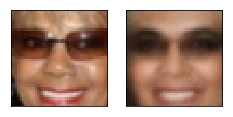

Epoch 36. Avg train loss: -14541.3037109375


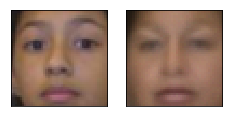

Avg valid loss: -14983.818359375


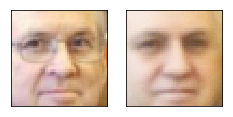

Epoch 37. Avg train loss: -14610.6875


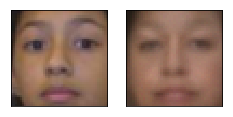

Avg valid loss: -14995.5888671875


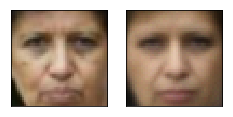

Epoch 38. Avg train loss: -14627.8291015625


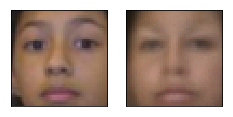

Avg valid loss: -14922.9951171875


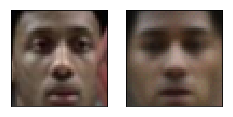

Epoch 39. Avg train loss: -14641.111328125


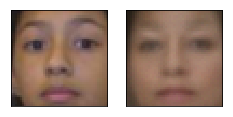

Avg valid loss: -15068.4765625


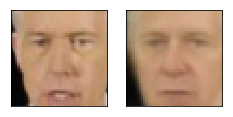

Epoch 40. Avg train loss: -14689.3876953125


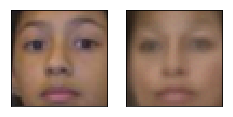

Avg valid loss: -15109.828125


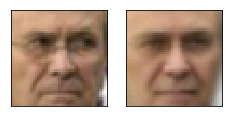

Epoch 41. Avg train loss: -14701.263671875


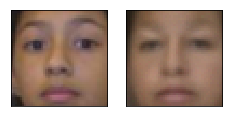

Avg valid loss: -15087.8359375


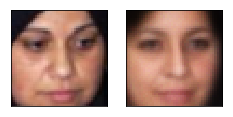

Epoch 42. Avg train loss: -14662.33984375


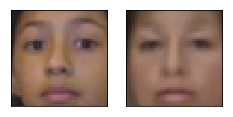

Avg valid loss: -15167.9775390625


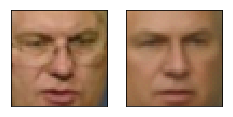

Epoch 43. Avg train loss: -14743.5185546875


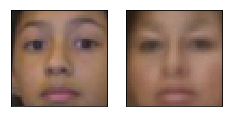

Avg valid loss: -15092.884765625


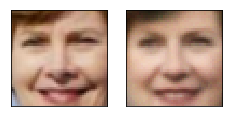

Epoch 44. Avg train loss: -14747.4873046875


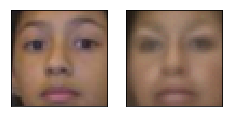

Avg valid loss: -14859.7314453125


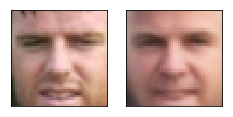

Epoch 45. Avg train loss: -14785.5634765625


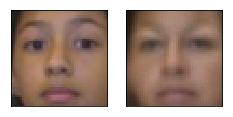

Avg valid loss: -14352.951171875


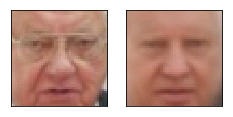

Epoch 46. Avg train loss: -14751.669921875


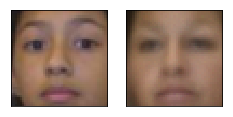

Avg valid loss: -15202.6875


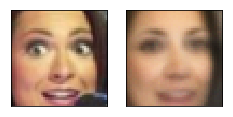

Epoch 47. Avg train loss: -14845.947265625


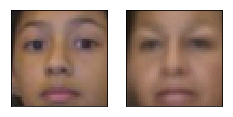

Avg valid loss: -15290.84765625


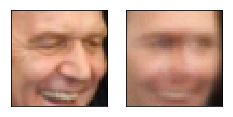

Epoch 48. Avg train loss: -14935.5029296875


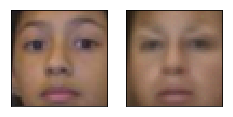

Avg valid loss: -15116.2568359375


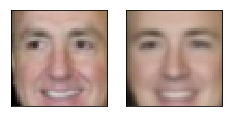

Epoch 49. Avg train loss: -14895.0


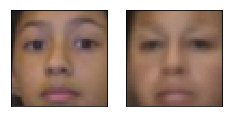

Avg valid loss: -15257.634765625


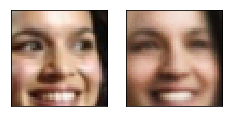

Epoch 50. Avg train loss: -14848.150390625


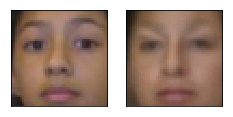

Avg valid loss: -15154.751953125


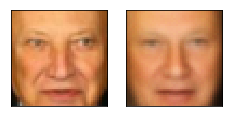

Epoch 51. Avg train loss: -14879.419921875


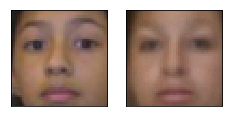

Avg valid loss: -15405.7021484375


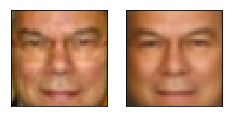

Epoch 52. Avg train loss: -14922.3525390625


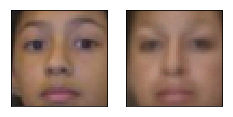

Avg valid loss: -15488.8466796875


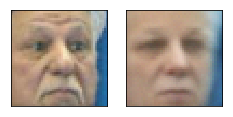

Epoch 53. Avg train loss: -14995.3271484375


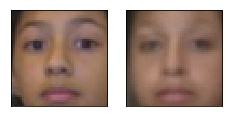

Avg valid loss: -15326.3134765625


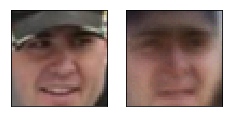

Epoch 54. Avg train loss: -14928.0322265625


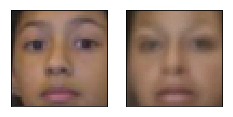

Avg valid loss: -15405.947265625


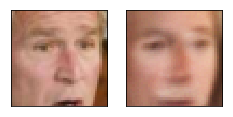

Epoch 55. Avg train loss: -15037.85546875


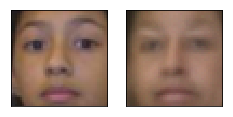

Avg valid loss: -15289.275390625


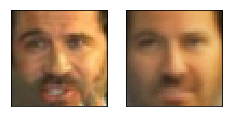

Epoch 56. Avg train loss: -14967.1103515625


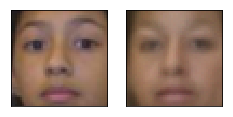

Avg valid loss: -15413.67578125


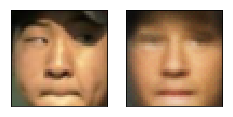

Epoch 57. Avg train loss: -15026.6220703125


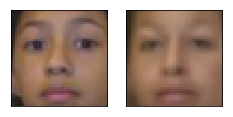

Avg valid loss: -15569.6396484375


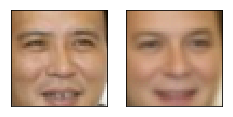

Epoch 58. Avg train loss: -15130.4970703125


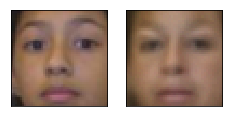

Avg valid loss: -15511.779296875


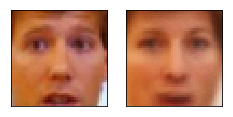

Epoch 59. Avg train loss: -15058.662109375


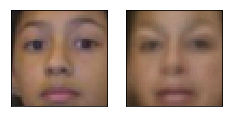

Avg valid loss: -15522.421875


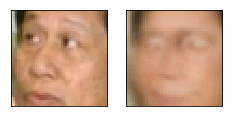

Epoch 60. Avg train loss: -15101.6064453125


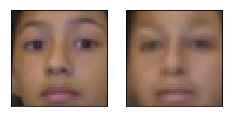

Avg valid loss: -15575.880859375


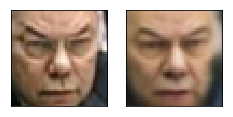

Epoch 61. Avg train loss: -15131.548828125


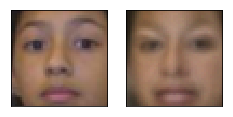

Avg valid loss: -15525.328125


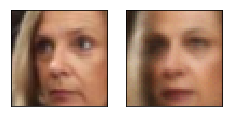

Epoch 62. Avg train loss: -15107.9697265625


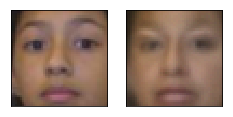

Avg valid loss: -15592.0107421875


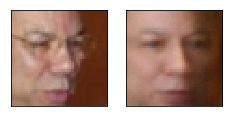

Epoch 63. Avg train loss: -15128.8310546875


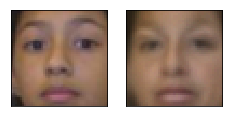

Avg valid loss: -15517.828125


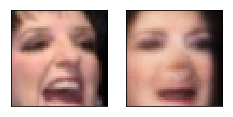

Epoch 64. Avg train loss: -15144.3154296875


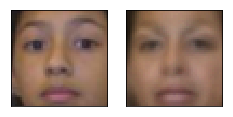

Avg valid loss: -15634.505859375


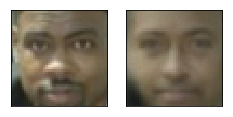

Epoch 65. Avg train loss: -15127.5341796875


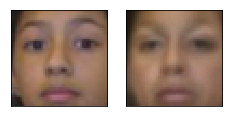

Avg valid loss: -15678.42578125


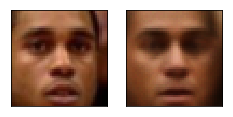

Epoch 66. Avg train loss: -15185.892578125


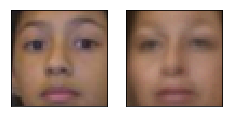

Avg valid loss: -15501.93359375


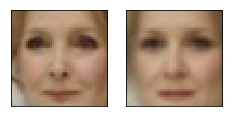

Epoch 67. Avg train loss: -15193.943359375


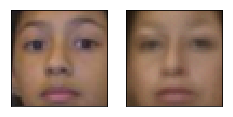

Avg valid loss: -15717.02734375


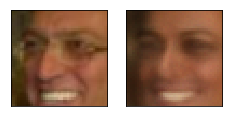

Epoch 68. Avg train loss: -15234.2451171875


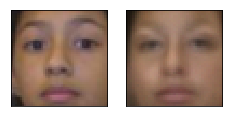

Avg valid loss: -15665.361328125


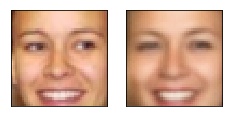

Epoch 69. Avg train loss: -15156.5087890625


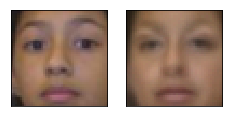

Avg valid loss: -15634.62890625


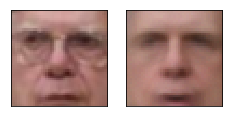

Epoch 70. Avg train loss: -15218.5888671875


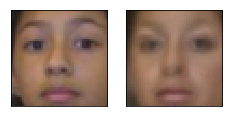

Avg valid loss: -15780.875


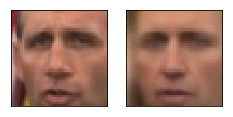

Epoch 71. Avg train loss: -15213.1796875


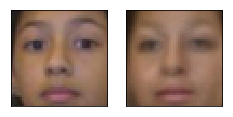

Avg valid loss: -15687.5263671875


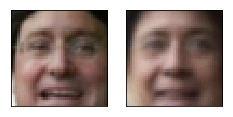

Epoch 72. Avg train loss: -15257.544921875


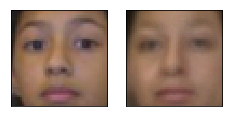

Avg valid loss: -15820.9306640625


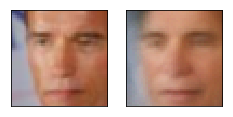

Epoch 73. Avg train loss: -15353.755859375


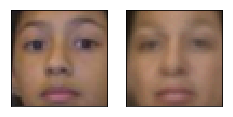

Avg valid loss: -15878.12109375


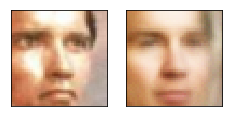

Epoch 74. Avg train loss: -15266.8828125


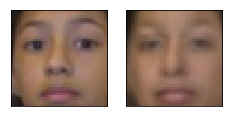

Avg valid loss: -15941.529296875


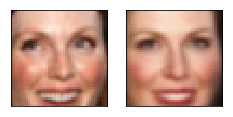

Epoch 75. Avg train loss: -15302.75


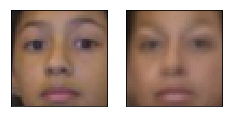

Avg valid loss: -15892.044921875


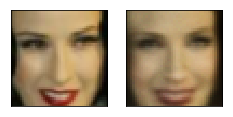

Epoch 76. Avg train loss: -15330.3427734375


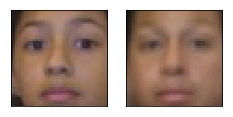

Avg valid loss: -15818.0986328125


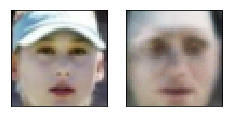

Epoch 77. Avg train loss: -15328.1865234375


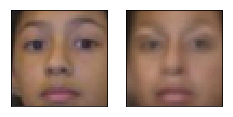

Avg valid loss: -15858.17578125


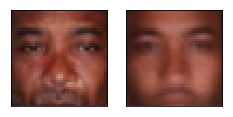

Epoch 78. Avg train loss: -15350.0


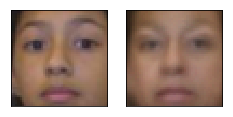

Avg valid loss: -15898.126953125


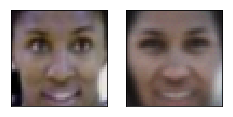

Epoch 79. Avg train loss: -15400.0966796875


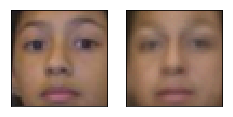

Avg valid loss: -15939.1416015625


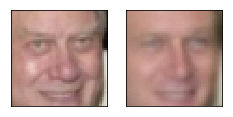

Epoch 80. Avg train loss: -15383.669921875


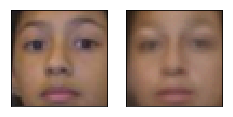

Avg valid loss: -15959.98828125


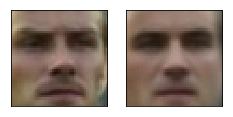

Epoch 81. Avg train loss: -15287.599609375


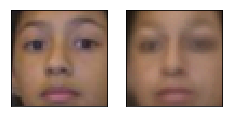

Avg valid loss: -15945.275390625


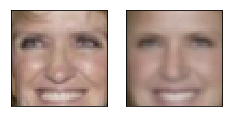

Epoch 82. Avg train loss: -15443.21484375


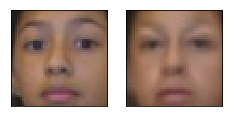

Avg valid loss: -15837.869140625


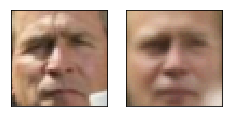

Epoch 83. Avg train loss: -15472.23046875


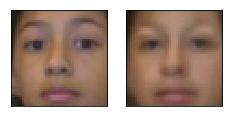

Avg valid loss: -15549.66015625


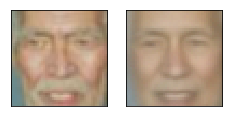

Epoch 84. Avg train loss: -15420.103515625


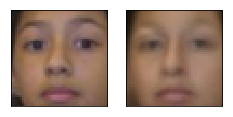

Avg valid loss: -15953.986328125


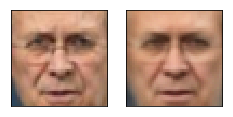

Epoch 85. Avg train loss: -15375.3876953125


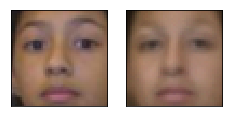

Avg valid loss: -16147.794921875


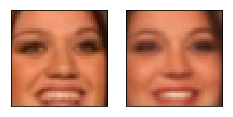

Epoch 86. Avg train loss: -15438.1376953125


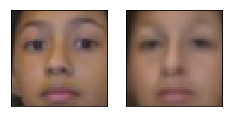

Avg valid loss: -15957.5546875


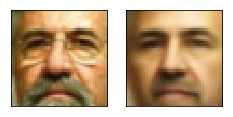

Epoch 87. Avg train loss: -15473.9521484375


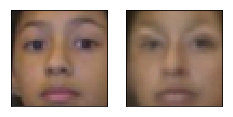

Avg valid loss: -14486.822265625


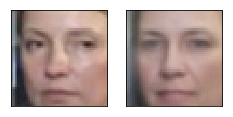

Epoch 88. Avg train loss: -15344.46875


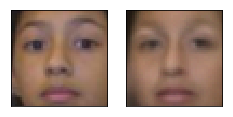

Avg valid loss: -15934.3759765625


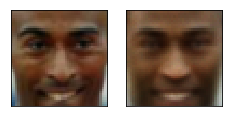

Epoch 89. Avg train loss: -15526.3671875


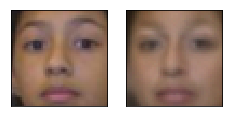

Avg valid loss: -15910.0791015625


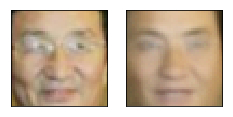

Epoch 90. Avg train loss: -15525.802734375


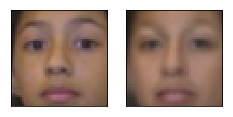

Avg valid loss: -16146.509765625


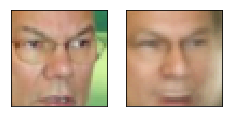

Epoch 91. Avg train loss: -15495.599609375


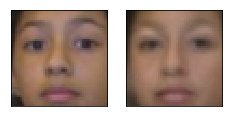

Avg valid loss: -16156.1884765625


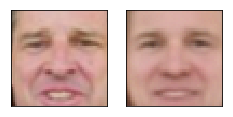

Epoch 92. Avg train loss: -15523.625


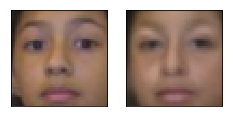

Avg valid loss: -16119.7607421875


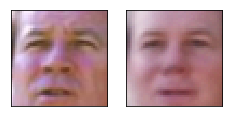

Epoch 93. Avg train loss: -15543.7021484375


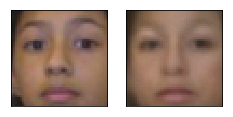

Avg valid loss: -16053.29296875


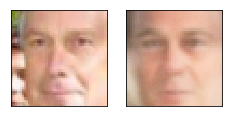

Epoch 94. Avg train loss: -15551.5


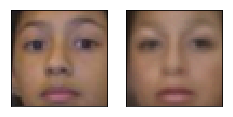

Avg valid loss: -16108.603515625


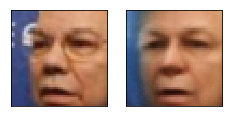

Epoch 95. Avg train loss: -15585.0263671875


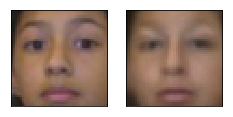

Avg valid loss: -15697.65234375


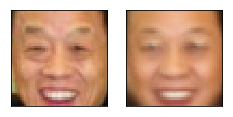

Epoch 96. Avg train loss: -15560.0224609375


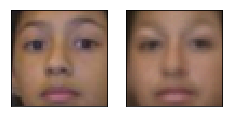

Avg valid loss: -15981.404296875


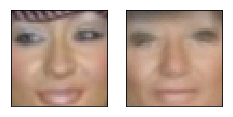

Epoch 97. Avg train loss: -15544.3671875


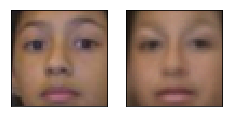

Avg valid loss: -16134.669921875


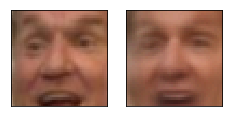

Epoch 98. Avg train loss: -15578.931640625


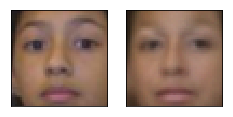

Avg valid loss: -16150.373046875


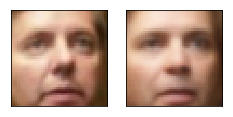

Epoch 99. Avg train loss: -15587.54296875


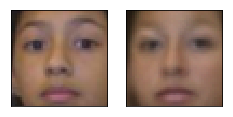

Avg valid loss: -16157.01171875


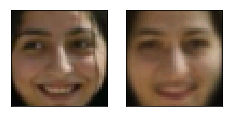

Epoch 100. Avg train loss: -15586.9072265625


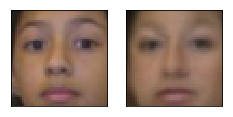

Avg valid loss: -16099.724609375


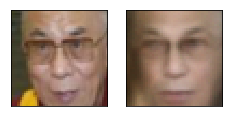

Epoch 101. Avg train loss: -15589.8388671875


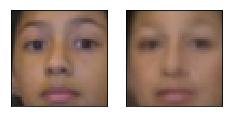

Avg valid loss: -16136.8193359375


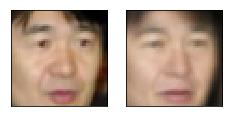

Epoch 102. Avg train loss: -15580.1640625


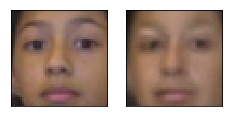

Avg valid loss: -16180.0341796875


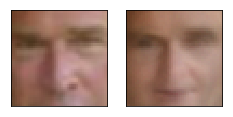

Epoch 103. Avg train loss: -15466.5322265625


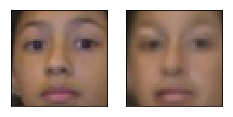

Avg valid loss: -16323.28515625


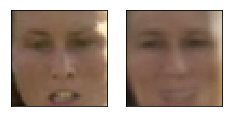

Epoch 104. Avg train loss: -15660.5888671875


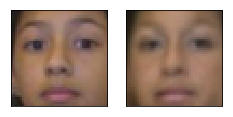

Avg valid loss: -16192.826171875


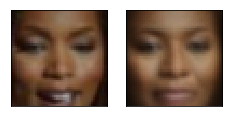

Epoch 105. Avg train loss: -15560.1337890625


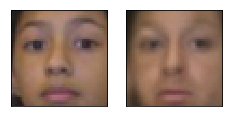

Avg valid loss: -16183.599609375


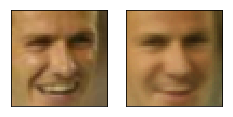

Epoch 106. Avg train loss: -15630.00390625


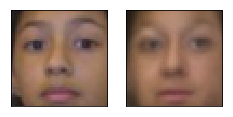

Avg valid loss: -16073.6630859375


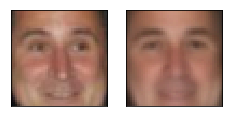

Epoch 107. Avg train loss: -15608.8310546875


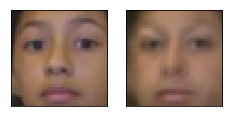

Avg valid loss: -16193.2109375


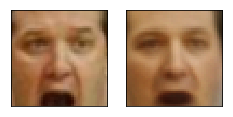

Epoch 108. Avg train loss: -15624.4375


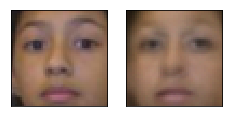

Avg valid loss: -16233.103515625


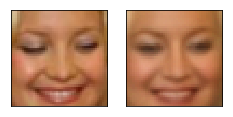

Epoch 109. Avg train loss: -15692.9609375


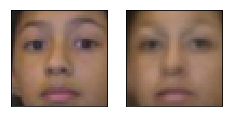

Avg valid loss: -16419.5625


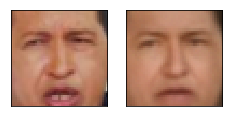

Epoch 110. Avg train loss: -15699.986328125


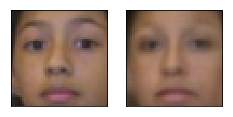

Avg valid loss: -16304.80078125


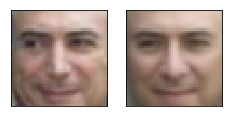

Epoch 111. Avg train loss: -15717.6689453125


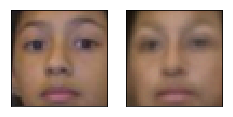

Avg valid loss: -16107.8515625


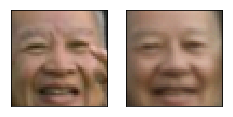

Epoch 112. Avg train loss: -15655.6884765625


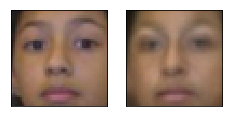

Avg valid loss: -16247.38671875


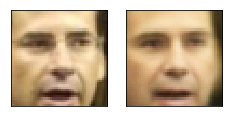

Epoch 113. Avg train loss: -15730.017578125


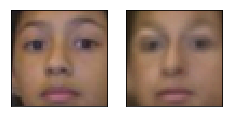

Avg valid loss: -16156.8974609375


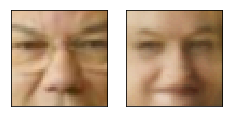

Epoch 114. Avg train loss: -15694.4560546875


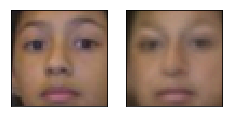

Avg valid loss: -16174.125


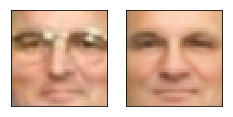

Epoch 115. Avg train loss: -15785.294921875


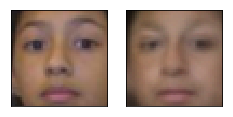

Avg valid loss: -15865.2626953125


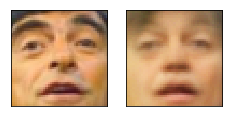

Epoch 116. Avg train loss: -15675.181640625


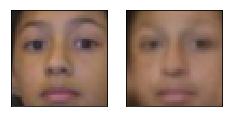

Avg valid loss: -15970.205078125


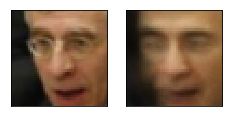

Epoch 117. Avg train loss: -15660.6796875


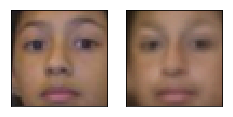

Avg valid loss: -16340.244140625


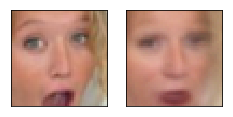

Epoch 118. Avg train loss: -15821.69140625


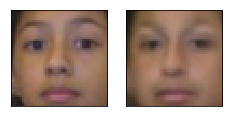

Avg valid loss: -16562.76171875


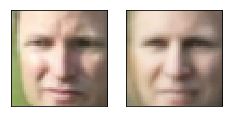

Epoch 119. Avg train loss: -15833.4296875


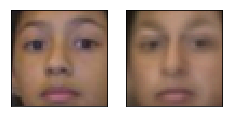

Avg valid loss: -16110.71484375


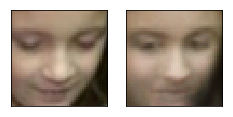

Epoch 120. Avg train loss: -15796.517578125


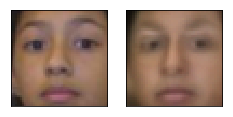

Avg valid loss: -16282.2802734375


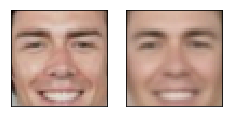

Epoch 121. Avg train loss: -15856.7978515625


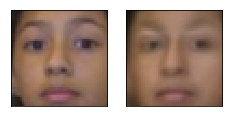

Avg valid loss: -16272.1591796875


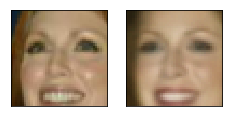

Epoch 122. Avg train loss: -15732.2626953125


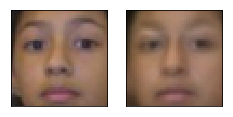

Avg valid loss: -16437.650390625


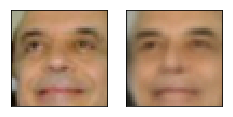

Epoch 123. Avg train loss: -15812.0439453125


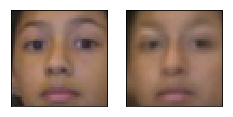

Avg valid loss: -16670.671875


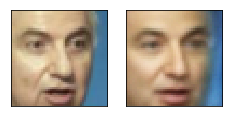

Epoch 124. Avg train loss: -15798.392578125


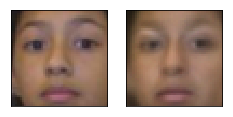

Avg valid loss: -16657.5


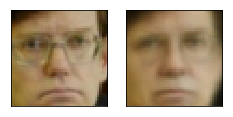

Epoch 125. Avg train loss: -15775.5048828125


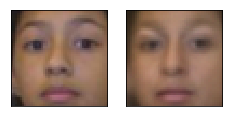

Avg valid loss: -16630.30078125


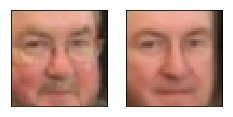

Epoch 126. Avg train loss: -15841.8095703125


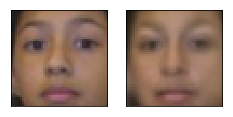

Avg valid loss: -16576.857421875


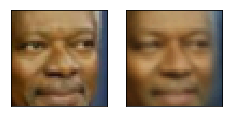

Epoch 127. Avg train loss: -15858.134765625


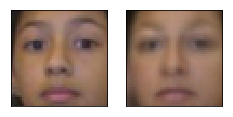

Avg valid loss: -16437.609375


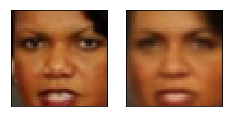

Epoch 128. Avg train loss: -15796.2763671875


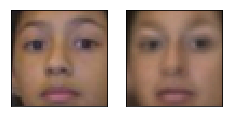

Avg valid loss: -16397.845703125


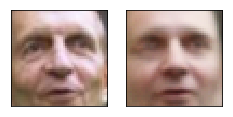

Epoch 129. Avg train loss: -15824.7373046875


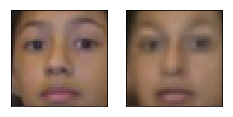

Avg valid loss: -16398.5859375


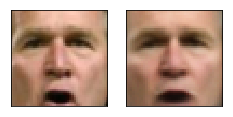

Epoch 130. Avg train loss: -15864.482421875


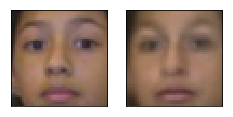

Avg valid loss: -16492.361328125


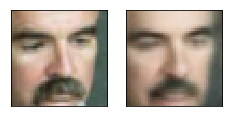

Epoch 131. Avg train loss: -15776.1875


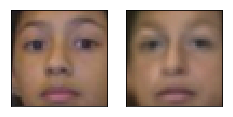

Avg valid loss: -16334.4560546875


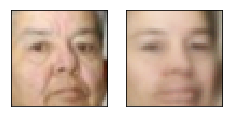

Epoch 132. Avg train loss: -15809.6611328125


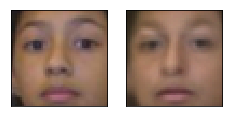

Avg valid loss: -16415.5703125


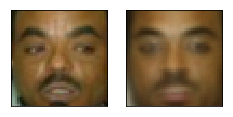

Epoch 133. Avg train loss: -15929.3564453125


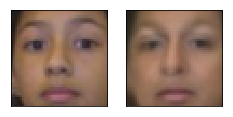

Avg valid loss: -16512.763671875


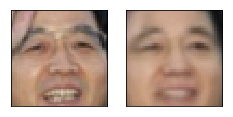

Epoch 134. Avg train loss: -15894.0322265625


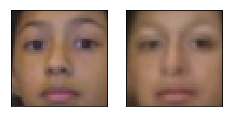

Avg valid loss: -16470.53125


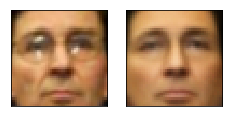

Epoch 135. Avg train loss: -15854.255859375


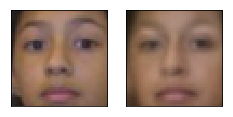

Avg valid loss: -16660.462890625


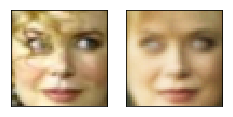

Epoch 136. Avg train loss: -15849.326171875


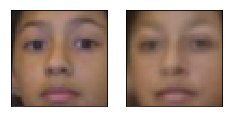

Avg valid loss: -16450.943359375


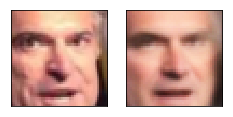

Epoch 137. Avg train loss: -15928.3583984375


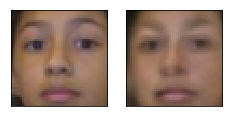

Avg valid loss: -16384.521484375


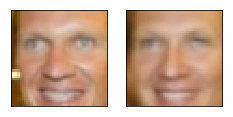

Epoch 138. Avg train loss: -15950.7001953125


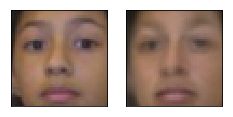

Avg valid loss: -16437.91796875


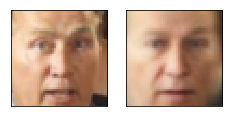

Epoch 139. Avg train loss: -15898.0361328125


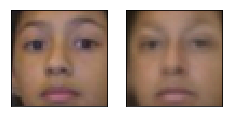

Avg valid loss: -16308.4208984375


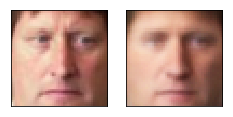

Epoch 140. Avg train loss: -15979.2412109375


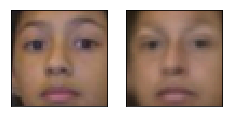

Avg valid loss: -16310.93359375


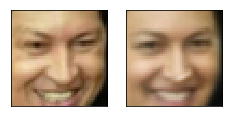

Epoch 141. Avg train loss: -15933.267578125


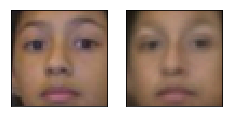

Avg valid loss: -16407.6640625


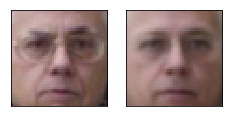

Epoch 142. Avg train loss: -15921.06640625


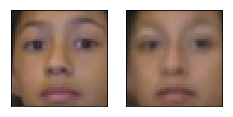

Avg valid loss: -16703.388671875


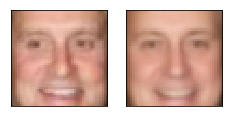

Epoch 143. Avg train loss: -16000.8134765625


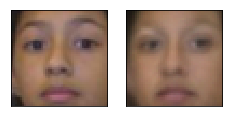

Avg valid loss: -16542.30078125


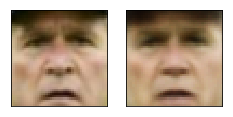

Epoch 144. Avg train loss: -15959.857421875


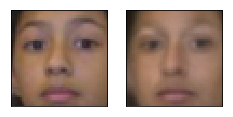

Avg valid loss: -16427.29296875


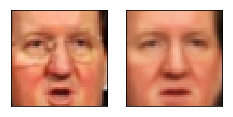

Epoch 145. Avg train loss: -15931.9658203125


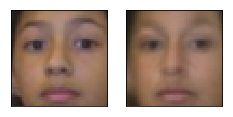

Avg valid loss: -16459.0546875


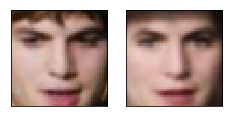

Epoch 146. Avg train loss: -15962.61328125


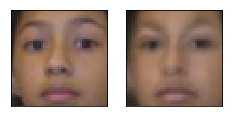

Avg valid loss: -16554.56640625


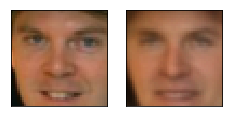

Epoch 147. Avg train loss: -15947.53125


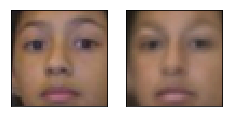

Avg valid loss: -16712.5234375


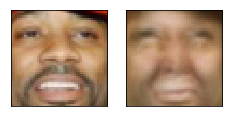

Epoch 148. Avg train loss: -15976.8623046875


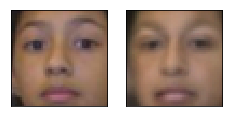

Avg valid loss: -16553.23828125


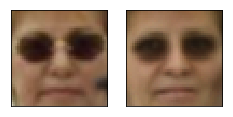

Epoch 149. Avg train loss: -15925.5703125


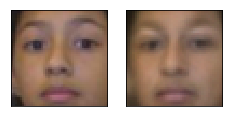

Avg valid loss: -16403.916015625


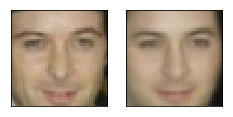

Epoch 150. Avg train loss: -16008.8115234375


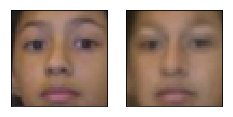

Avg valid loss: -16319.255859375


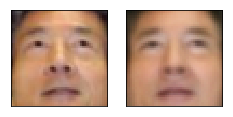

Epoch 151. Avg train loss: -15987.03515625


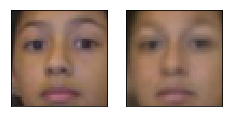

Avg valid loss: -16436.60546875


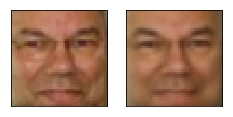

Epoch 152. Avg train loss: -16029.7802734375


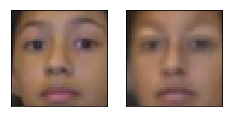

Avg valid loss: -15963.4365234375


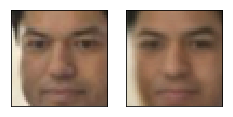

Epoch 153. Avg train loss: -15969.3466796875


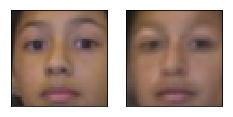

Avg valid loss: -16000.6240234375


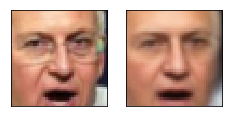

Epoch 154. Avg train loss: -15813.17578125


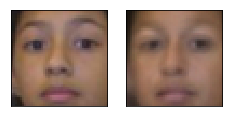

Avg valid loss: -16391.79296875


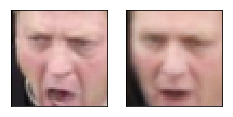

Epoch 155. Avg train loss: -16005.865234375


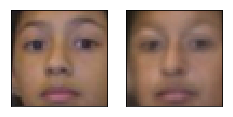

Avg valid loss: -16294.263671875


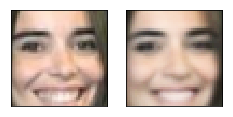

Epoch 156. Avg train loss: -16097.912109375


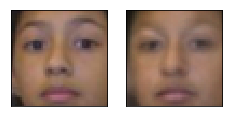

Avg valid loss: -16550.06640625


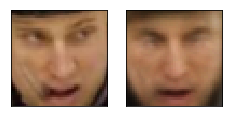

Epoch 157. Avg train loss: -16064.775390625


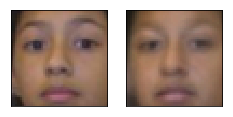

Avg valid loss: -16514.53125


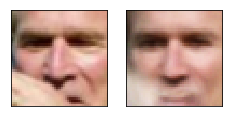

Epoch 158. Avg train loss: -16026.1025390625


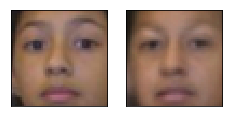

Avg valid loss: -16291.9267578125


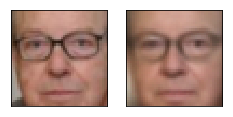

Epoch 159. Avg train loss: -16026.4521484375


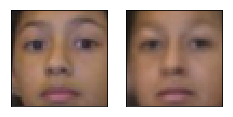

Avg valid loss: -16449.775390625


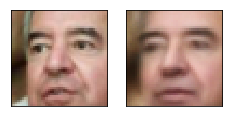

Epoch 160. Avg train loss: -15963.59765625


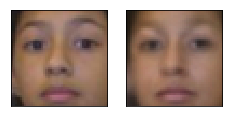

Avg valid loss: -16223.982421875


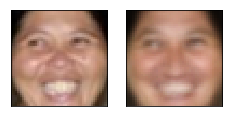

Epoch 161. Avg train loss: -15983.724609375


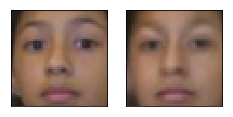

Avg valid loss: -16719.99609375


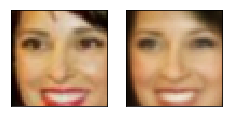

Epoch 162. Avg train loss: -16139.97265625


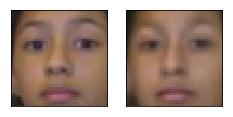

Avg valid loss: -16948.751953125


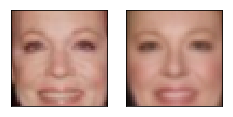

Epoch 163. Avg train loss: -16075.083984375


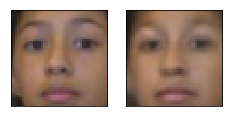

Avg valid loss: -16388.45703125


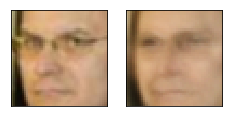

Epoch 164. Avg train loss: -16021.4033203125


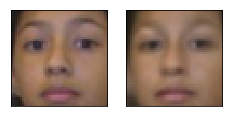

Avg valid loss: -16699.05078125


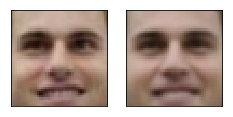

Epoch 165. Avg train loss: -16143.396484375


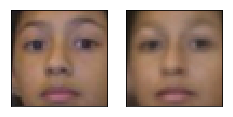

Avg valid loss: -16971.5859375


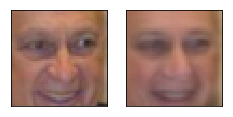

Epoch 166. Avg train loss: -16106.205078125


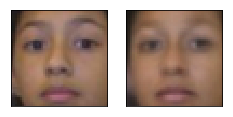

Avg valid loss: -16698.9765625


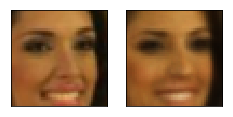

Epoch 167. Avg train loss: -16017.9501953125


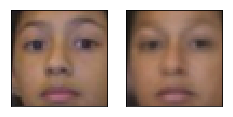

Avg valid loss: -16435.1171875


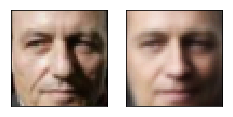

Epoch 168. Avg train loss: -16007.27734375


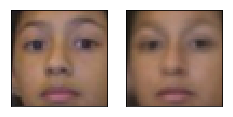

Avg valid loss: -16831.37109375


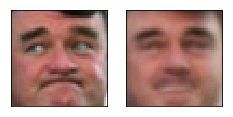

Epoch 169. Avg train loss: -16072.44140625


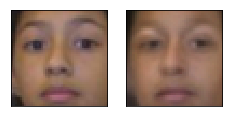

Avg valid loss: -16424.5859375


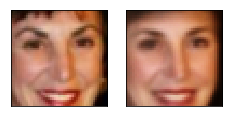

Epoch 170. Avg train loss: -16108.607421875


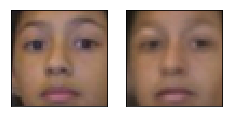

Avg valid loss: -16763.83984375


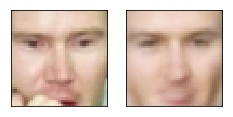

Epoch 171. Avg train loss: -16131.0166015625


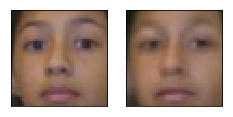

Avg valid loss: -17008.87890625


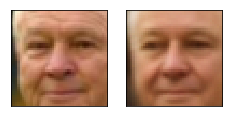

Epoch 172. Avg train loss: -16079.37890625


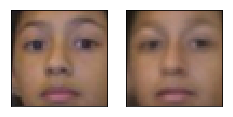

Avg valid loss: -17030.078125


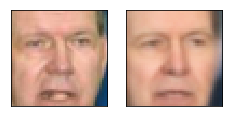

Epoch 173. Avg train loss: -16147.3916015625


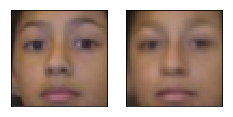

Avg valid loss: -16883.365234375


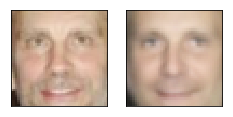

Epoch 174. Avg train loss: -16056.72265625


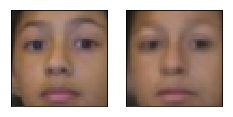

Avg valid loss: -16694.033203125


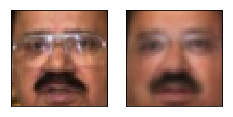

Epoch 175. Avg train loss: -16128.2958984375


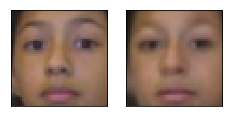

Avg valid loss: -16695.2109375


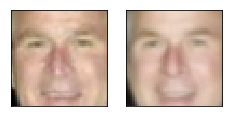

Epoch 176. Avg train loss: -16099.3046875


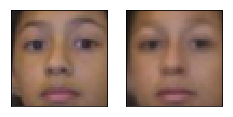

Avg valid loss: -16938.47265625


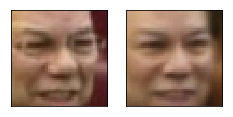

Epoch 177. Avg train loss: -16101.451171875


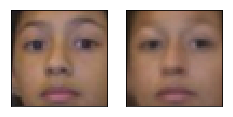

Avg valid loss: -16940.75390625


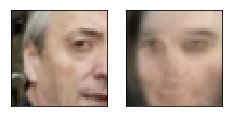

Epoch 178. Avg train loss: -16020.21875


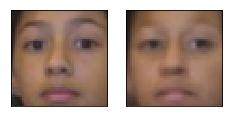

Avg valid loss: -16544.7265625


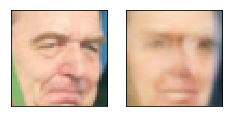

Epoch 179. Avg train loss: -16143.15234375


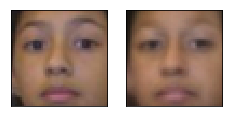

Avg valid loss: -16641.421875


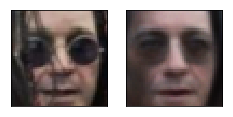

Epoch 180. Avg train loss: -16205.884765625


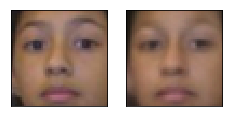

Avg valid loss: -16831.056640625


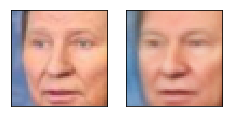

Epoch 181. Avg train loss: -16177.6103515625


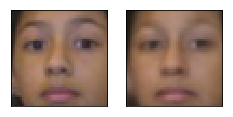

Avg valid loss: -17160.720703125


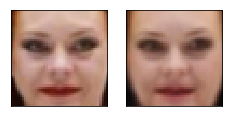

Epoch 182. Avg train loss: -16071.6083984375


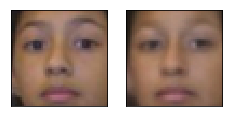

Avg valid loss: -17216.74609375


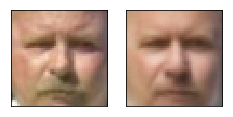

Epoch 183. Avg train loss: -16207.2646484375


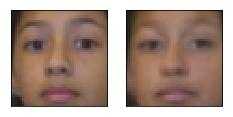

Avg valid loss: -17061.85546875


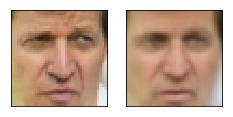

Epoch 184. Avg train loss: -16068.2783203125


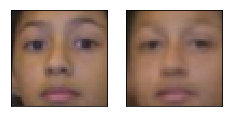

Avg valid loss: -16761.32421875


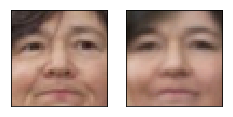

Epoch 185. Avg train loss: -16165.4775390625


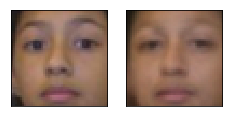

Avg valid loss: -16929.666015625


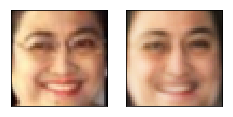

Epoch 186. Avg train loss: -16082.7412109375


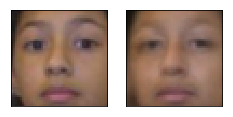

Avg valid loss: -16685.404296875


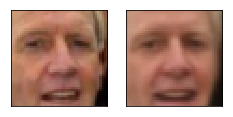

Epoch 187. Avg train loss: -16190.46484375


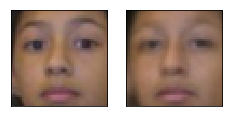

Avg valid loss: -16933.75


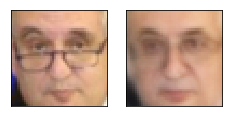

Epoch 188. Avg train loss: -16276.49609375


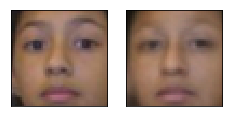

Avg valid loss: -16893.51171875


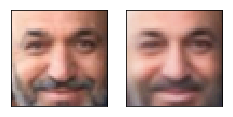

Epoch 189. Avg train loss: -16081.50390625


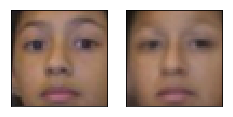

Avg valid loss: -16875.14453125


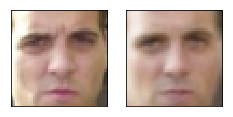

Epoch 190. Avg train loss: -16201.169921875


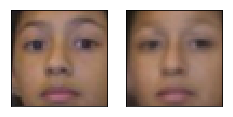

Avg valid loss: -17010.103515625


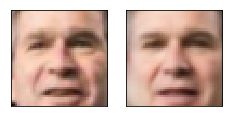

Epoch 191. Avg train loss: -16150.4091796875


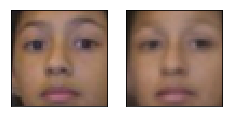

Avg valid loss: -17117.515625


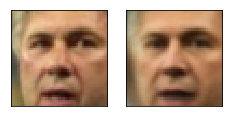

Epoch 192. Avg train loss: -16149.5927734375


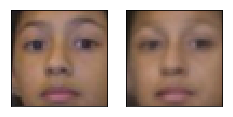

Avg valid loss: -16821.07421875


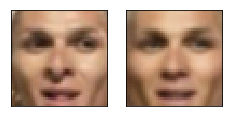

Epoch 193. Avg train loss: -16127.0810546875


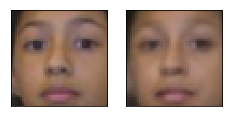

Avg valid loss: -16981.3046875


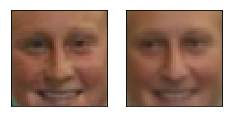

Epoch 194. Avg train loss: -16104.4052734375


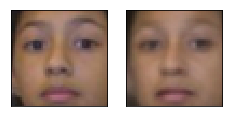

Avg valid loss: -16949.6875


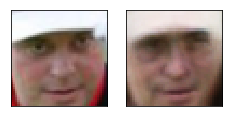

Epoch 195. Avg train loss: -16179.5703125


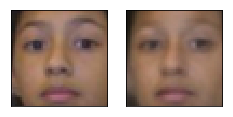

Avg valid loss: -16871.166015625


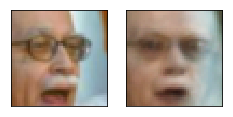

Epoch 196. Avg train loss: -16213.056640625


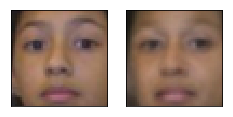

Avg valid loss: -16615.48828125


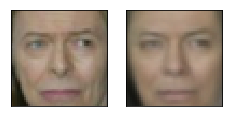

Epoch 197. Avg train loss: -16136.912109375


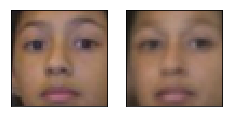

Avg valid loss: -16873.58984375


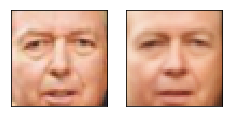

Epoch 198. Avg train loss: -16176.2177734375


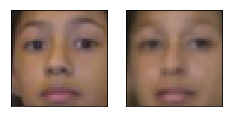

Avg valid loss: -16850.76953125


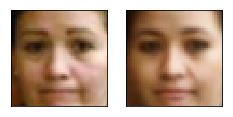

Epoch 199. Avg train loss: -16099.611328125


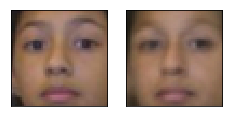

Avg valid loss: -16940.65625


In [33]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay
num_epochs = 200
for epoch in range(num_epochs):
    vae.train(True)
    losses = []
    for idx, (img_batch, _)  in enumerate(train_loader):
        img_batch = torch.autograd.Variable(img_batch).cuda()
        (reconstruction_mu, reconstruction_logsigma,
         latent_mu, latent_logsigma) = vae(img_batch)
        loss = criterion(img_batch,reconstruction_mu, reconstruction_logsigma,
                         latent_mu, latent_logsigma)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        losses.append(loss.data.cpu().numpy()[0])
    plot_gallery([img_batch[0].data.cpu().numpy(),
                  reconstruction_mu[0].data.cpu().numpy()],
                 image_h, image_w, n_col=2, n_row=1)
    print("Epoch {}. Avg train loss: {}".format(epoch, np.mean(losses)))
    vae.train(False)
    losses = []
    for idx, (img_batch, _) in enumerate(val_loader):
        img_batch = torch.autograd.Variable(img_batch).cuda()
        (reconstruction_mu, reconstruction_logsigma,
         latent_mu, latent_logsigma) = vae(img_batch)
        loss = criterion(img_batch,reconstruction_mu, reconstruction_logsigma,
                         latent_mu, latent_logsigma)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        losses.append(loss.data.cpu().numpy()[0])
    plot_gallery([img_batch[0].data.cpu().numpy(),
                  reconstruction_mu[0].data.cpu().numpy()],
                 image_h, image_w, n_col=2, n_row=1)
    print("Avg valid loss: {}".format(np.mean(losses)))

In [44]:
val_loader = data_utils.DataLoader(val, batch_size=100, shuffle=True)

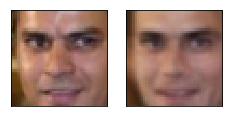

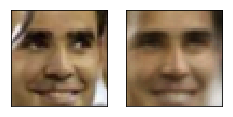

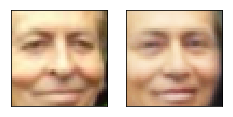

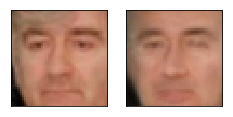

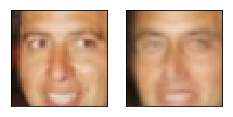

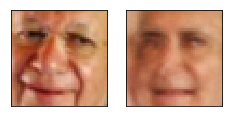

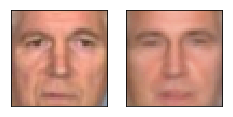

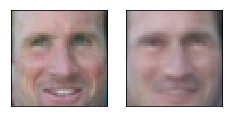

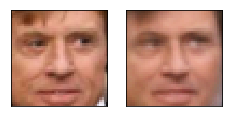

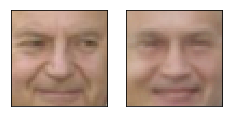

In [163]:
# val_loader = data_utils.DataLoader(val, batch_size=1, shuffle=True)
vae.eval()
for j, data_ in enumerate(val_loader, 0):
    input = Variable(data_[0].cuda())
    reconstruction_mu, _, _, _ = vae(input)
    plot_gallery([data_[0][0].numpy(), reconstruction_mu[0].data.cpu().numpy()], image_h, image_w, n_row=1, n_col=2)
    if (j >= 9):
        break

And finally sample from VAE.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


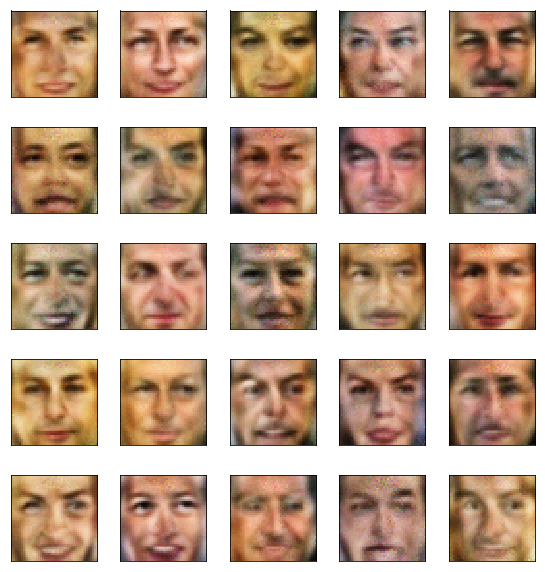

In [60]:
# TODO
# Sample some images from the learned distribution
# 1) Sample z ~ N(0,1)

# 2) Sample from N(decoder_mu(z), decoder_sigma(z))
vae.train(False)
z = np.random.randn(25, dimZ) * 1
decoder_output = vae.decoder(Variable(torch.from_numpy(z).cuda()).float())
mu = F.sigmoid(vae.reconstruction_mu_producer(decoder_output))
logsigma = vae.reconstruction_logsigma_producer(decoder_output)
sampled_imgs = 0.5 * np.random.randn(25, 6075) * np.exp(logsigma.data.cpu().numpy()) + mu.data.cpu().numpy()
plot_gallery(sampled_imgs, image_h, image_w, n_row=5, n_col=5)

Even if in practice you do not see the much difference between AE and VAE, or VAE is even worse, the little bayesian inside you should be jumping for joy right now. 

In VAE you can truly sample from image distribution $p(x)$, while in AE there is no easy and correct way to do it. 

# Congrats! and Bonus

If you managed to tune your autoencoders to converge and learn something about the world, now it's time to make fun out of it. As you may have noticed, there are face attributes in dataset. We're interested in "Smiling" column, but feel free to try others as well! Here is the first task:

1) Extract the "Smiling" attribute and create a two sets of images: 10 smiling faces and 10 non-smiling ones.

2) Compute latent representations for each image in "smiling" set and average those latent vectors. Do the same for "non-smiling" set. You have found **"vector representation"** of the "smile" and "no smile" attribute.

3) Compute the difference: "smile" vector minus "non-smile" vector.

3) Now check if **"feature arithmetics"** works. Sample a face without smile, encode it and add the diff from p. 3. Check if it works with both AE and VAE. 

<img src="linear.png" alt="linear">

In [82]:
def extract_attribute_imgs(attribute, num_pics=10):
    sorted_by_attribute = attrs[attribute].sort_values(ascending=False)
    return (data[sorted_by_attribute[:num_pics].index].reshape(num_pics, -1),
            data[sorted_by_attribute[-num_pics:].index].reshape(num_pics, -1))

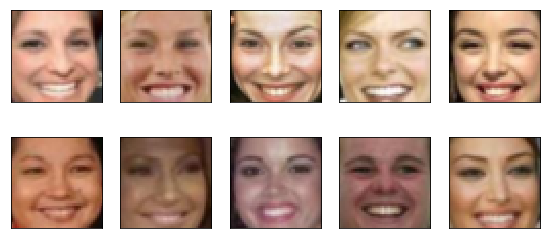

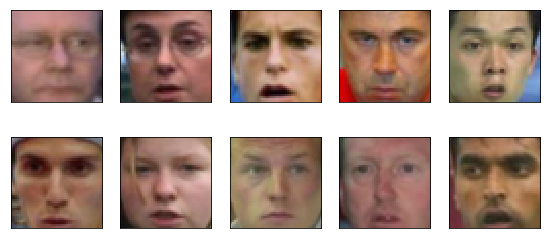

In [81]:
plot_gallery(extract_attribute_imgs("Smiling")[0], image_h, image_w, n_col=5, n_row=2)
plot_gallery(extract_attribute_imgs("Smiling")[1], image_h, image_w, n_col=5, n_row=2)

In [222]:
def get_latent_vec(img, use_vae):
    if len(img.shape) > 1:
        img = img.reshape(-1)
    img_var = torch.autograd.Variable(torch.FloatTensor(img[None, ...])).cuda()
    if use_vae:
        vae.train(False)
        latent_vec = vae.latent_mu_producer(vae.encoder(img_var))
    else:
        autoencoder.train(False)
        latent_vec = autoencoder.encoder(img_var)
    latent_vec = latent_vec.data.cpu().numpy().squeeze()
    return latent_vec

def get_img(latent_vec, use_vae):
    latent_var = torch.autograd.Variable(torch.FloatTensor(latent_vec[None, ...])).cuda()
    if use_vae:
        vae.train(False)
        reconstructed_vec = F.sigmoid(vae.reconstruction_mu_producer(vae.decoder(latent_var)))
    else:
        autoencoder.train(False)
        reconstructed_vec = autoencoder.decoder(latent_var)
    reconstructed_vec = reconstructed_vec.data.cpu().numpy().squeeze()
    return reconstructed_vec.reshape(image_h, image_w, 3)
    
def calc_avg_latent_vector(imgs, use_vae):
    attribute_vectors = []
    for img in imgs:
        attribute_vectors.append(get_latent_vec(img, use_vae))
    return np.mean(np.asarray(attribute_vectors).squeeze(), axis=0)

def attribute_shift_vec(attribute, use_vae=True):
    attribute_imgs, non_attribute_imgs = extract_attribute_imgs(attribute)
    attribute_imgs = attribute_imgs / 255
    non_attribute_imgs = non_attribute_imgs / 255
    attribute_vector = calc_avg_latent_vector(attribute_imgs, use_vae)
    non_attribute_vector = calc_avg_latent_vector(non_attribute_imgs, use_vae)
    return attribute_vector - non_attribute_vector

def apply_shift(img, vec, use_vae=True):
    img  = img / 255
    latent_vec = get_latent_vec(img, use_vae)
    return get_img(latent_vec + vec, use_vae)

def show_stages(img, attribute_shift_vec, use_vae=True):
    plt.imshow(img)
    plt.show()
    plt.figure(figsize=(1.5 * 10, 1.7))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for idx, alpha in enumerate(np.linspace(-1, 1, 10)):
        plt.subplot(1, 10, idx + 1)
        plt.imshow(apply_shift(img, alpha * attribute_shift_vec, use_vae))
    plt.show()

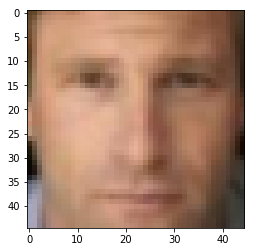

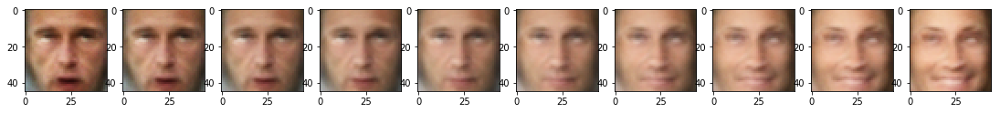

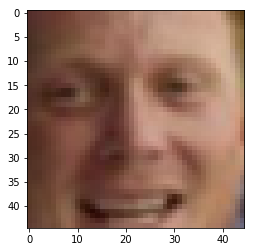

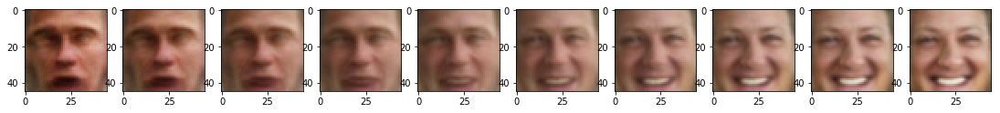

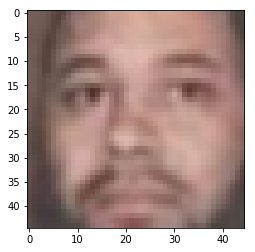

...

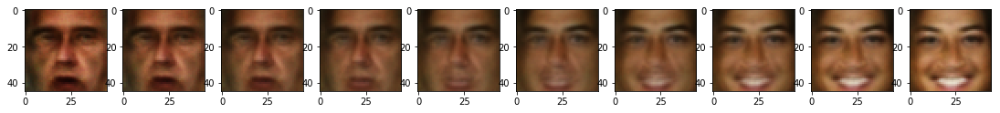

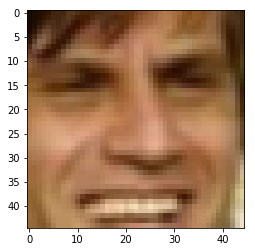

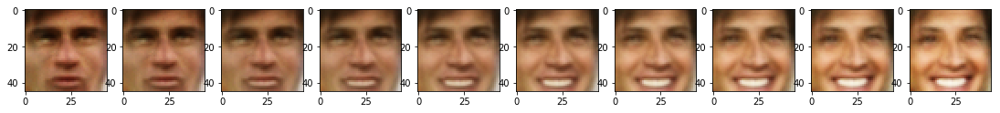

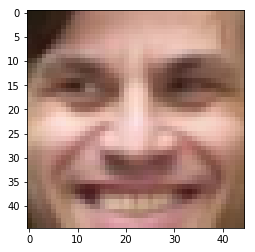

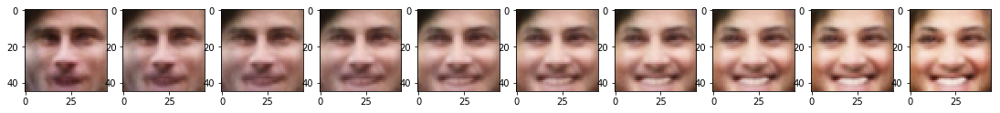

In [214]:
smile_vec = attribute_shift_vec("Smiling")
for img in data[:10]:
    show_stages(img, smile_vec)

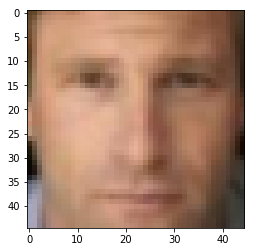

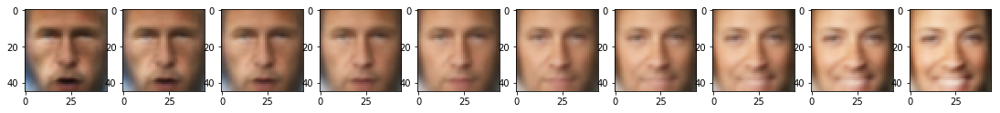

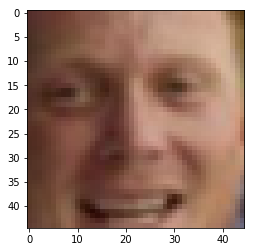

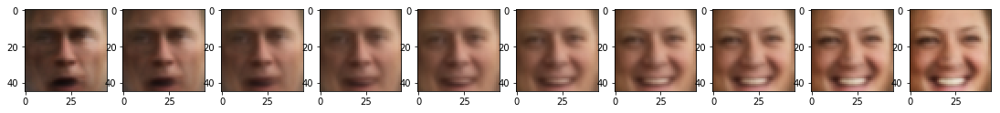

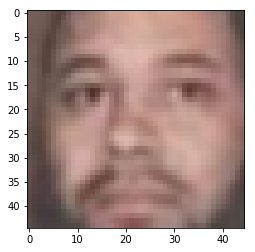

...

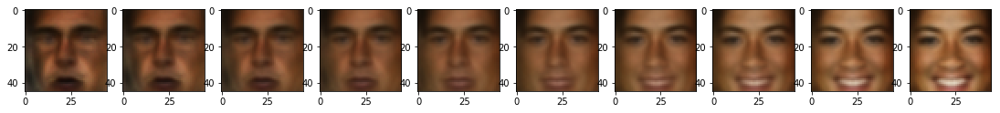

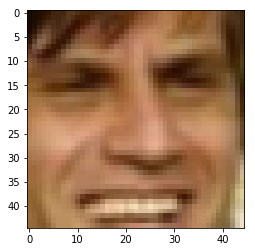

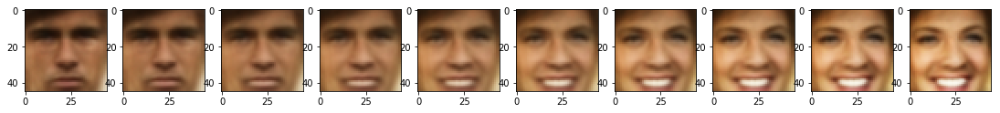

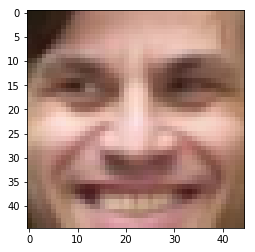

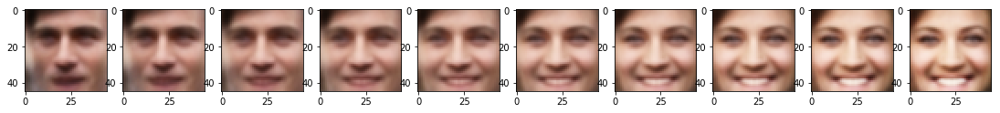

In [223]:
smile_vec = attribute_shift_vec("Smiling", use_vae=False)
for img in data[:10]:
    show_stages(img, smile_vec, use_vae=False)

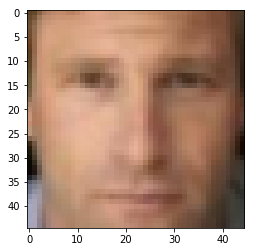

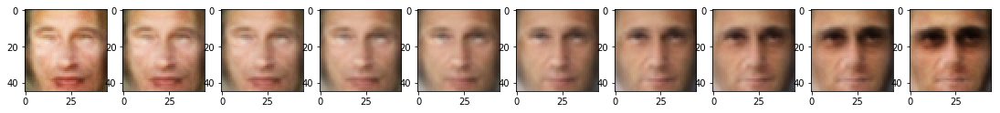

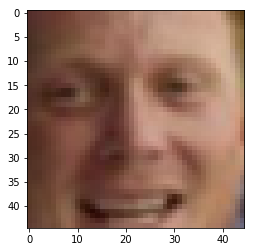

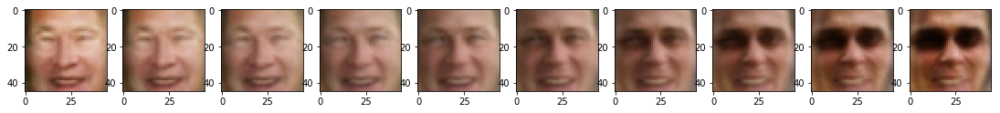

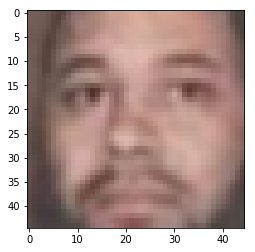

...

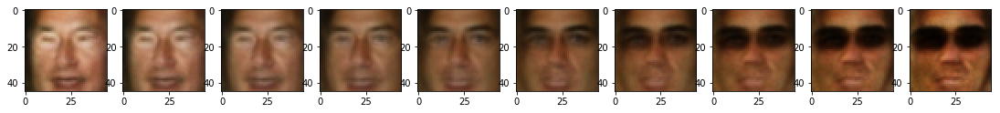

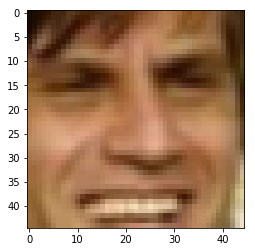

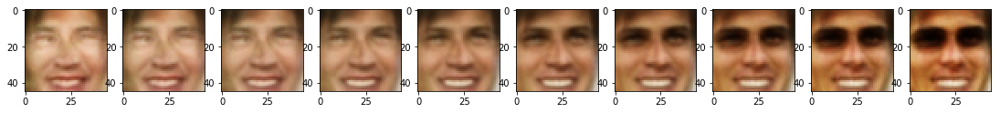

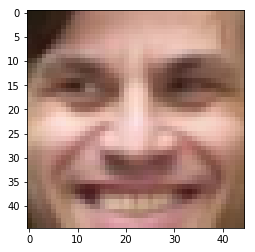

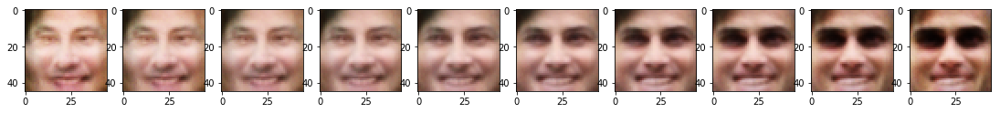

In [215]:
sunglasses_vec = attribute_shift_vec("Sunglasses")
for img in data[:10]:
    show_stages(img, sunglasses_vec)

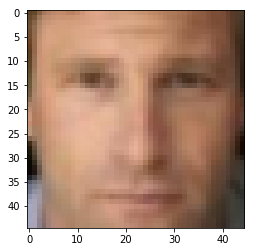

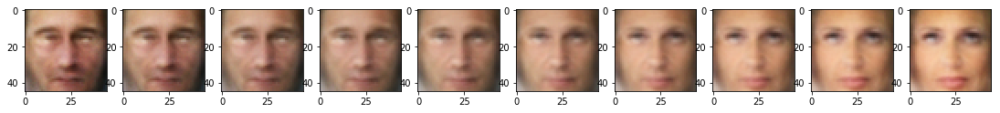

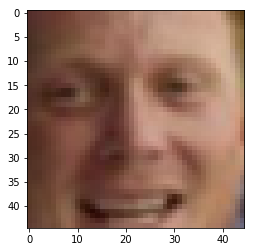

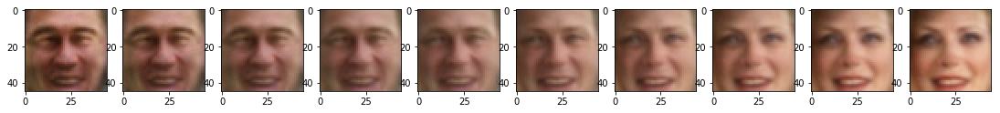

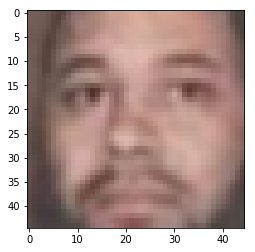

...

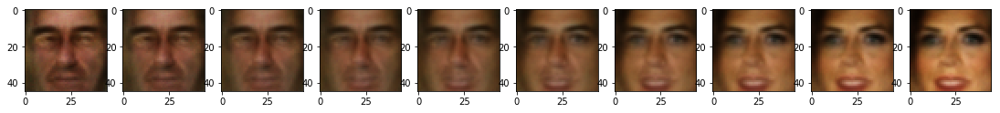

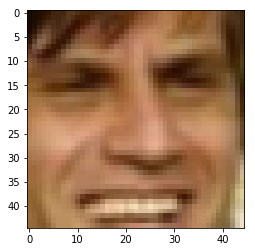

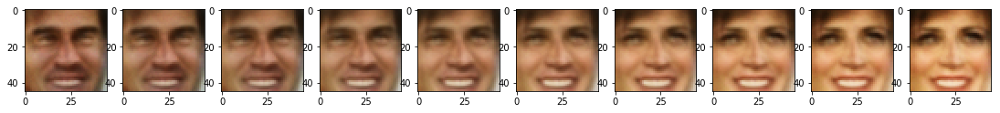

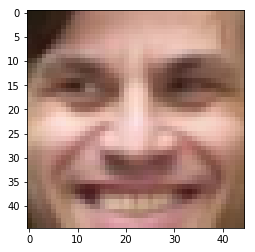

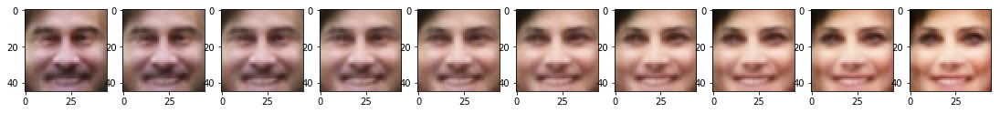

In [216]:
makeup_vec = attribute_shift_vec("Heavy Makeup")
for img in data[:10]:
    show_stages(img, makeup_vec)

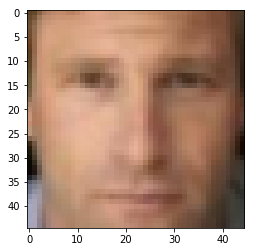

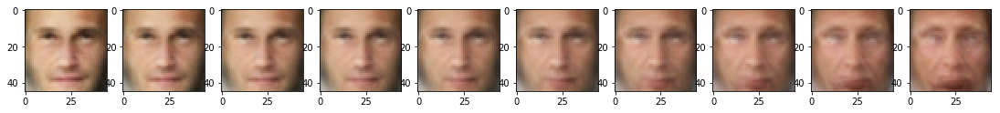

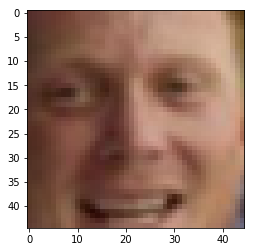

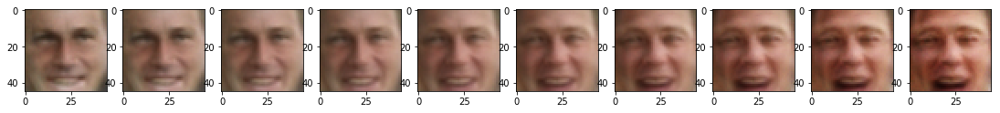

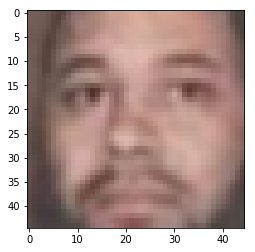

...

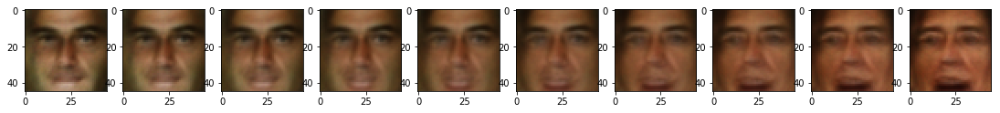

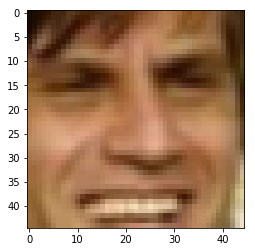

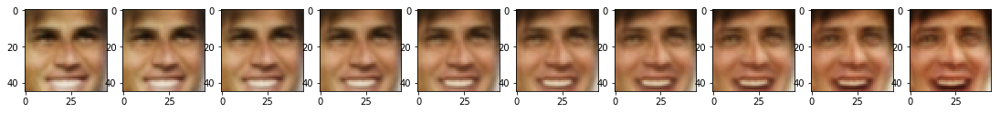

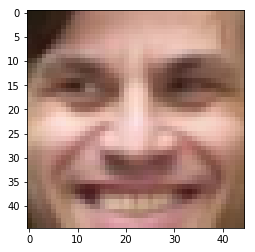

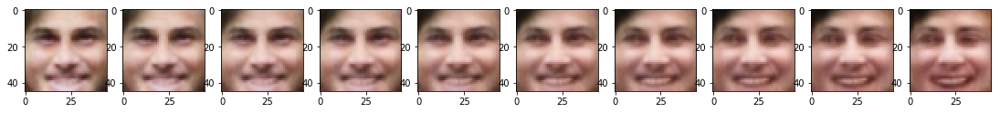

In [217]:
open_mouth_vec = attribute_shift_vec("Mouth Wide Open")
for img in data[:10]:
    show_stages(img, open_mouth_vec)

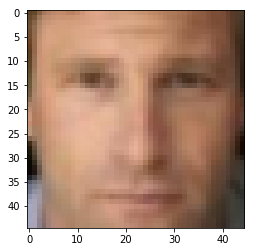

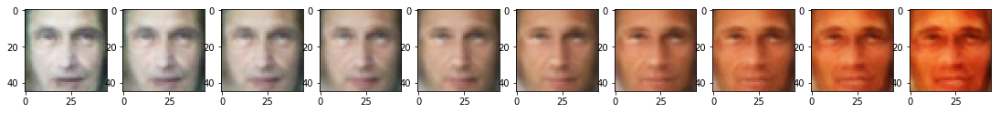

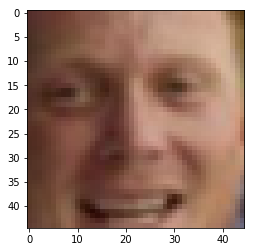

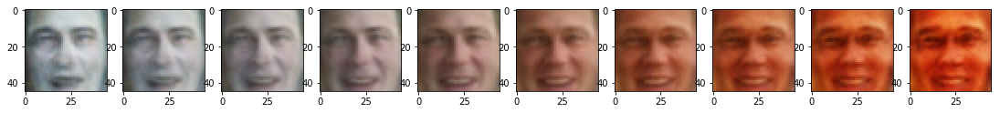

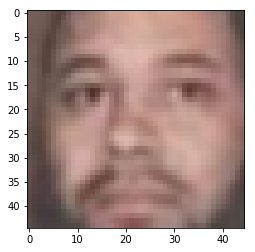

...

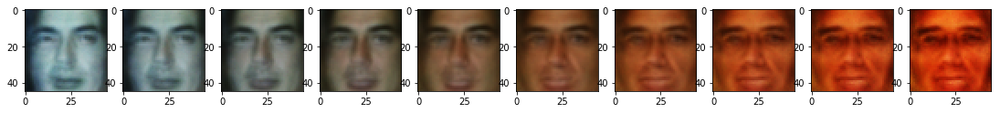

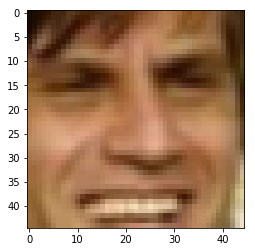

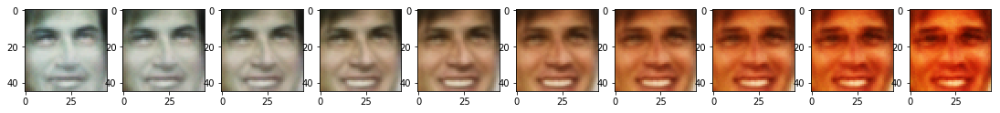

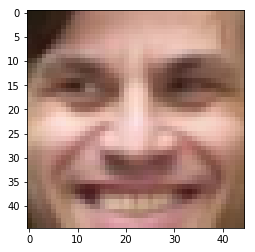

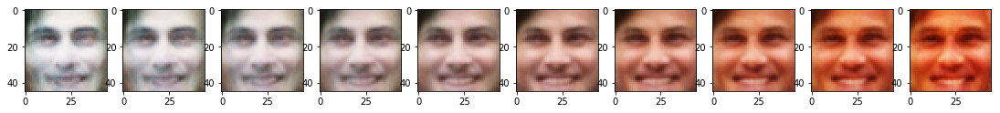

In [218]:
color_vec = attribute_shift_vec("Color Photo")
for img in data[:10]:
    show_stages(img, color_vec)